In [2]:
import mne
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
data = pd.read_csv('adhd2.csv')
data

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz,class
0,85.0,261.0,52.0,226.0,52.0,200.0,126.0,310.0,-20.0,236.0,126.0,200.0,-20.0,200.0,-20.0,347.0,85.0,50.0,85.0,0
1,156.0,508.0,126.0,226.0,126.0,236.0,89.0,310.0,-57.0,273.0,273.0,420.0,16.0,310.0,-57.0,89.0,297.0,121.0,85.0,0
2,297.0,473.0,89.0,332.0,52.0,163.0,-167.0,236.0,-20.0,126.0,236.0,273.0,-57.0,126.0,-167.0,273.0,402.0,15.0,-160.0,0
3,191.0,402.0,89.0,156.0,89.0,89.0,-94.0,163.0,-167.0,200.0,89.0,200.0,-57.0,52.0,-167.0,89.0,85.0,156.0,-90.0,0
4,156.0,402.0,89.0,121.0,52.0,126.0,-131.0,89.0,16.0,89.0,126.0,200.0,-20.0,52.0,-131.0,52.0,332.0,121.0,-55.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1918623,50.0,85.0,52.0,50.0,52.0,52.0,52.0,16.0,16.0,52.0,126.0,126.0,126.0,126.0,163.0,89.0,50.0,-19.0,50.0,1
1918624,121.0,85.0,126.0,15.0,126.0,16.0,52.0,16.0,-20.0,16.0,163.0,89.0,163.0,16.0,126.0,-20.0,50.0,-55.0,50.0,1
1918625,15.0,-55.0,52.0,-90.0,89.0,-57.0,89.0,-20.0,200.0,16.0,89.0,16.0,126.0,-20.0,52.0,-20.0,-19.0,-19.0,85.0,1
1918626,85.0,121.0,126.0,50.0,200.0,52.0,163.0,52.0,163.0,163.0,163.0,89.0,200.0,126.0,163.0,163.0,85.0,121.0,121.0,1


In [4]:
data.head()

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz,class
0,85.0,261.0,52.0,226.0,52.0,200.0,126.0,310.0,-20.0,236.0,126.0,200.0,-20.0,200.0,-20.0,347.0,85.0,50.0,85.0,0
1,156.0,508.0,126.0,226.0,126.0,236.0,89.0,310.0,-57.0,273.0,273.0,420.0,16.0,310.0,-57.0,89.0,297.0,121.0,85.0,0
2,297.0,473.0,89.0,332.0,52.0,163.0,-167.0,236.0,-20.0,126.0,236.0,273.0,-57.0,126.0,-167.0,273.0,402.0,15.0,-160.0,0
3,191.0,402.0,89.0,156.0,89.0,89.0,-94.0,163.0,-167.0,200.0,89.0,200.0,-57.0,52.0,-167.0,89.0,85.0,156.0,-90.0,0
4,156.0,402.0,89.0,121.0,52.0,126.0,-131.0,89.0,16.0,89.0,126.0,200.0,-20.0,52.0,-131.0,52.0,332.0,121.0,-55.0,0


<Axes: xlabel='class', ylabel='count'>

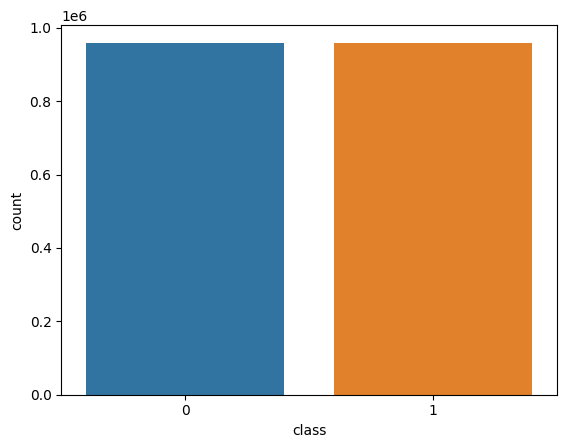

In [5]:
sns.countplot(x=data['class'], data=data)

In [6]:
data_normal = data[:959314]
data_normal.tail()
data_adhd = data[959314:]

In [7]:
channel_names = data.columns.tolist()
channel_names.remove('class')

In [8]:
# Define sampling frequency
sfreq = 128  # Sampling frequency in Hz

# Create MNE info object
info = mne.create_info(ch_names=channel_names, sfreq=sfreq, ch_types='eeg')

# Display the MNE info object
print(info)

<Info | 7 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T7, T8, P7, ...
 chs: 19 EEG
 custom_ref_applied: False
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 128.0 Hz
>


In [9]:
# Set the montage using standard 10-20 system
montage = mne.channels.make_standard_montage('standard_1020')
info.set_montage(montage)

# Display the updated MNE info object with montage
print(info)

<Info | 8 non-empty values
 bads: []
 ch_names: Fp1, Fp2, F3, F4, C3, C4, P3, P4, O1, O2, F7, F8, T7, T8, P7, ...
 chs: 19 EEG
 custom_ref_applied: False
 dig: 22 items (3 Cardinal, 19 EEG)
 highpass: 0.0 Hz
 lowpass: 64.0 Hz
 meas_date: unspecified
 nchan: 19
 projs: []
 sfreq: 128.0 Hz
>


In [10]:
# Convert DataFrame to NumPy array
eeg_adhd_data = data_adhd.drop('class', axis=1)
eeg_adhd_data = eeg_adhd_data.values.T  # Transpose to have channels as rows and samples as columns

# Create RawArray object with EEG data and MNE info
raw_adhd = mne.io.RawArray(eeg_adhd_data, info)

# Display the Raw object
print(raw_adhd)


Creating RawArray with float64 data, n_channels=19, n_times=959314
    Range : 0 ... 959313 =      0.000 ...  7494.633 secs
Ready.
<RawArray | 19 x 959314 (7494.6 s), ~139.1 MB, data loaded>


In [11]:
eeg_normal_data = data_normal.drop('class',axis=1)
eeg_normal_data = eeg_normal_data.values.T
raw_normal = mne.io.RawArray(eeg_normal_data, info)

Creating RawArray with float64 data, n_channels=19, n_times=959314
    Range : 0 ... 959313 =      0.000 ...  7494.633 secs
Ready.


Attempting to create new mne-python configuration file:
/root/.mne/mne-python.json
Using matplotlib as 2D backend.


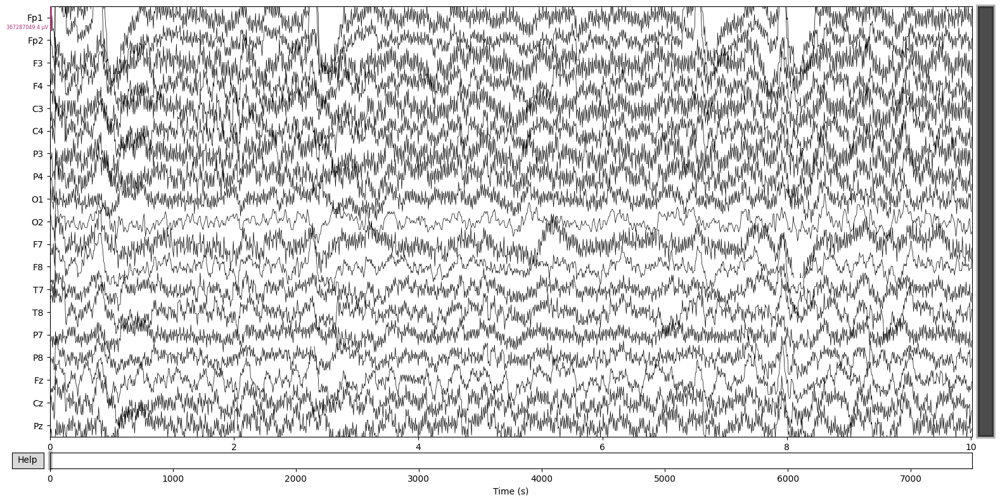

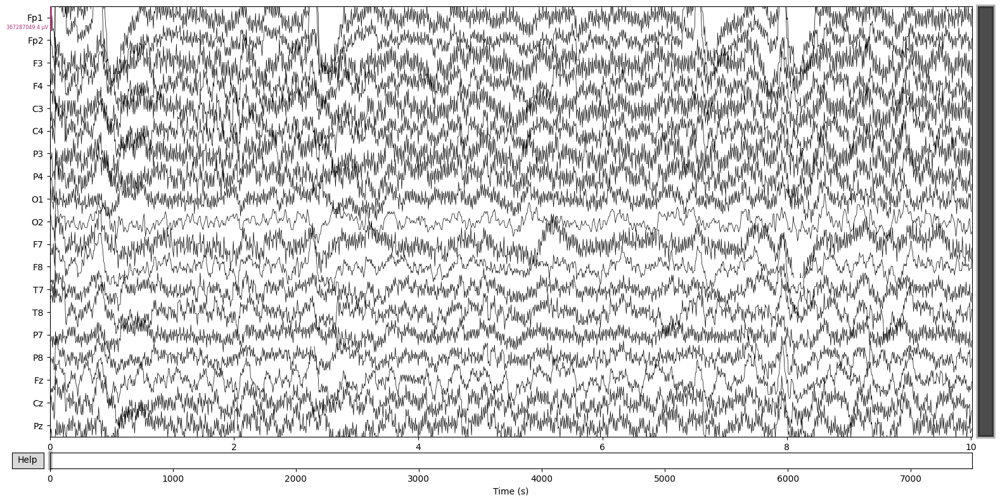

In [12]:
# Plot raw EEG data
mne.set_config('MNE_BROWSE_RAW_SIZE','16,8')  
raw_adhd.plot(n_channels=len(channel_names), scalings='auto', title='Raw EEG Data')


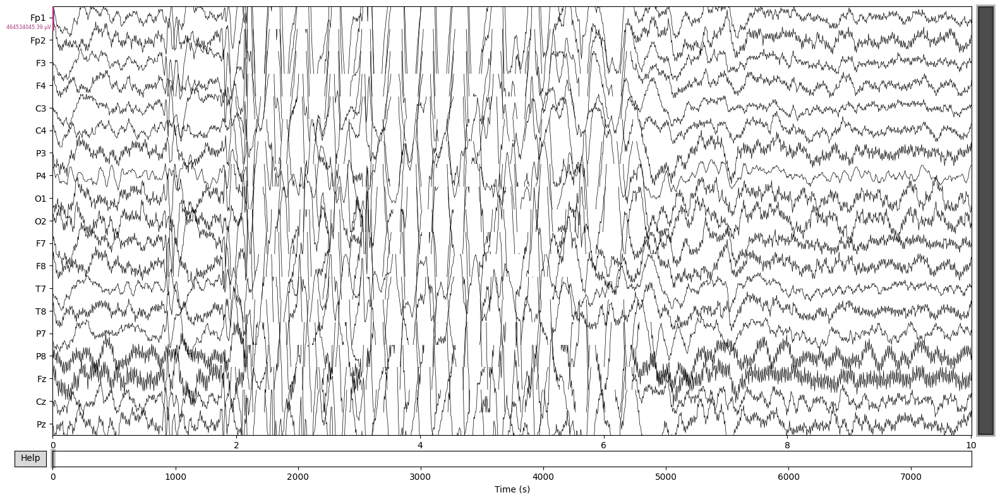

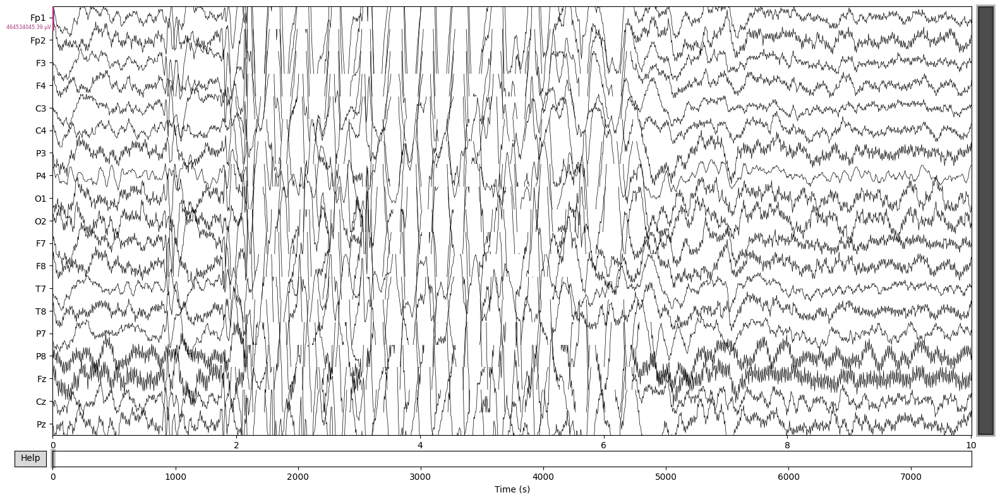

In [13]:
raw_normal.plot(n_channels=len(channel_names), scalings='auto', title='Raw EEG Data')

Effective window size : 16.000 (s)
Effective window size : 16.000 (s)


Text(0.5, 1.0, 'PSD After Filtering')

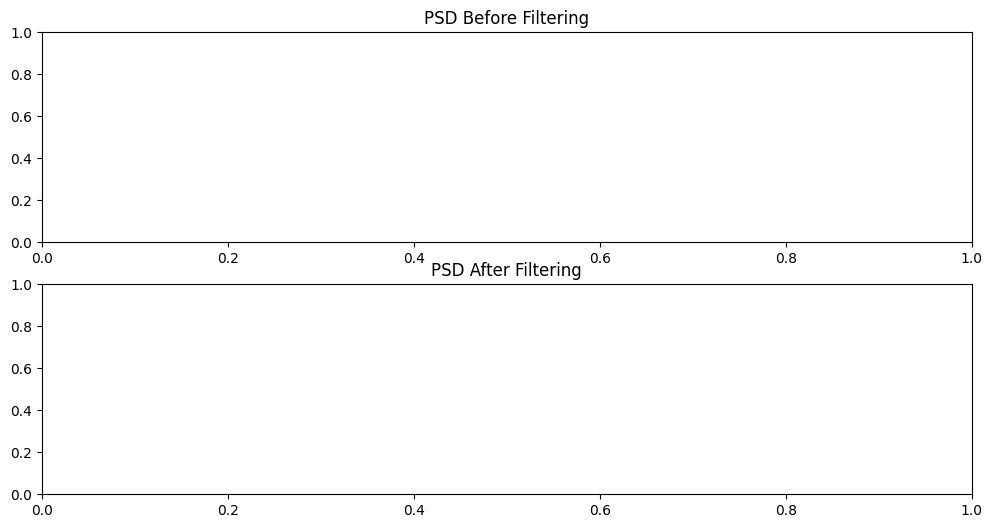

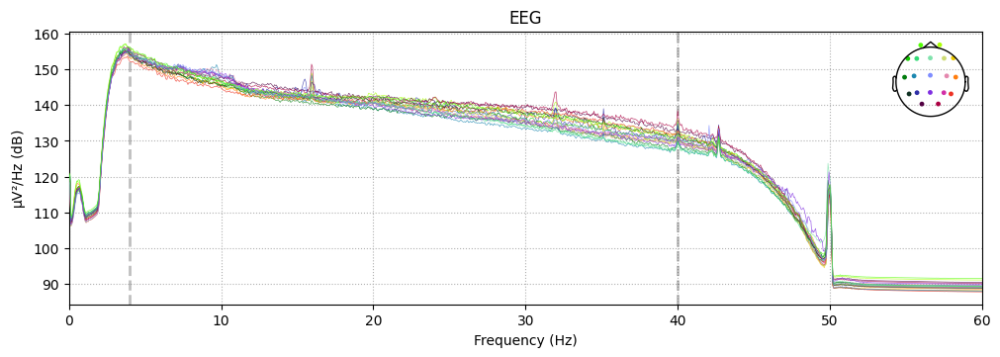

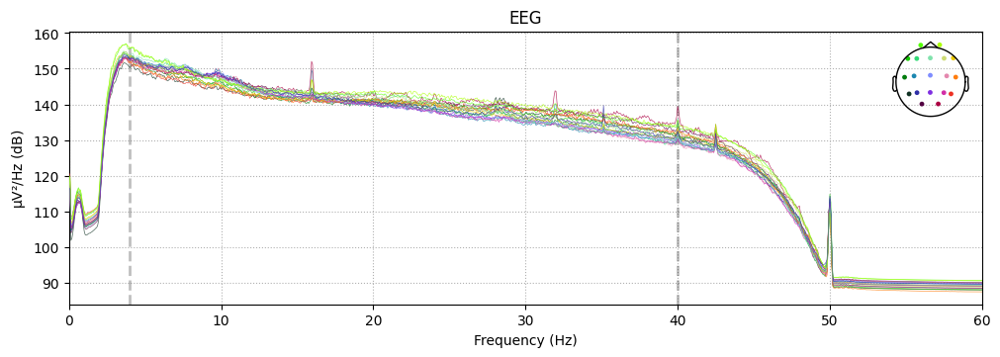

In [14]:
# Apply bandpass filter (4-40 Hz)
raw_normal_filtered = raw_normal.copy().filter(l_freq=4,h_freq = 40, method='fir', verbose=False)
raw_adhd_filtered = raw_adhd.copy().filter(l_freq=4,h_freq = 40, method='fir', verbose=False)
# Plot PSD before and after filtering
fig = plt.figure(figsize=(12, 6))
ax1 = fig.add_subplot(2, 1, 1)
raw_normal_filtered.compute_psd(fmax=60).plot()
ax1.set_title('PSD Before Filtering')

ax2 = fig.add_subplot(2, 1, 2)
raw_adhd_filtered.compute_psd(fmax=60).plot()
ax2.set_title('PSD After Filtering')

# plt.show()

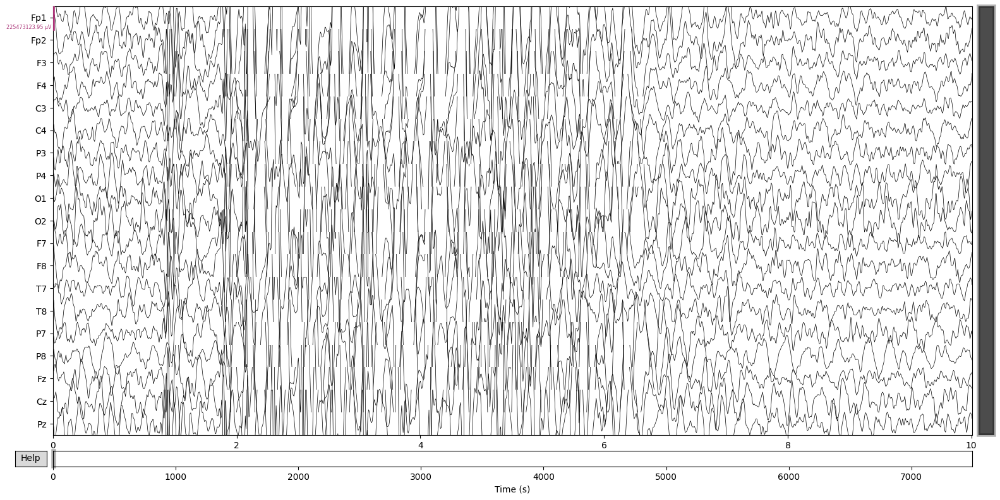

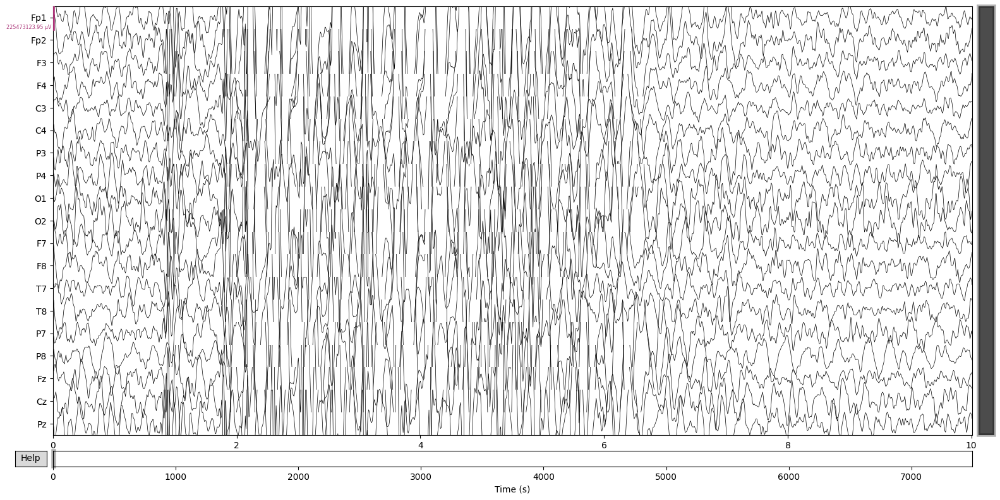

In [15]:
raw_normal_filtered.plot(scalings='auto')

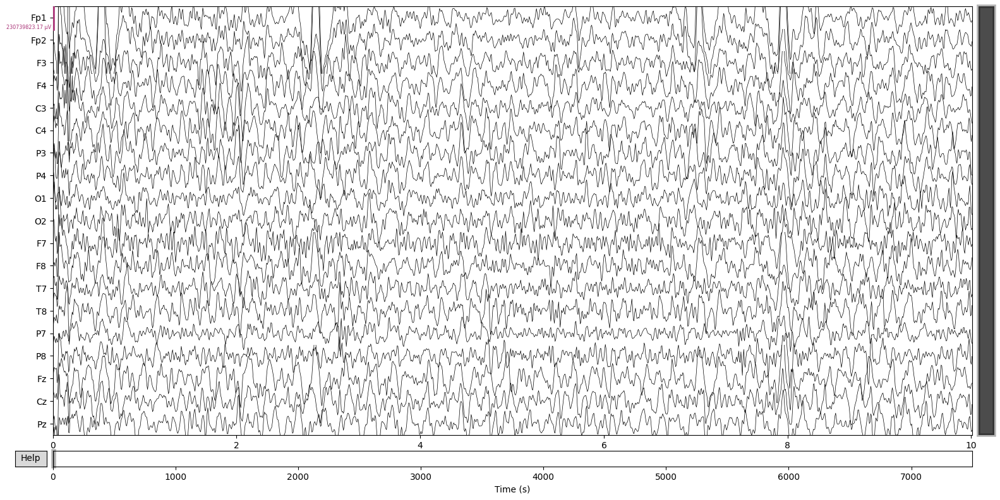

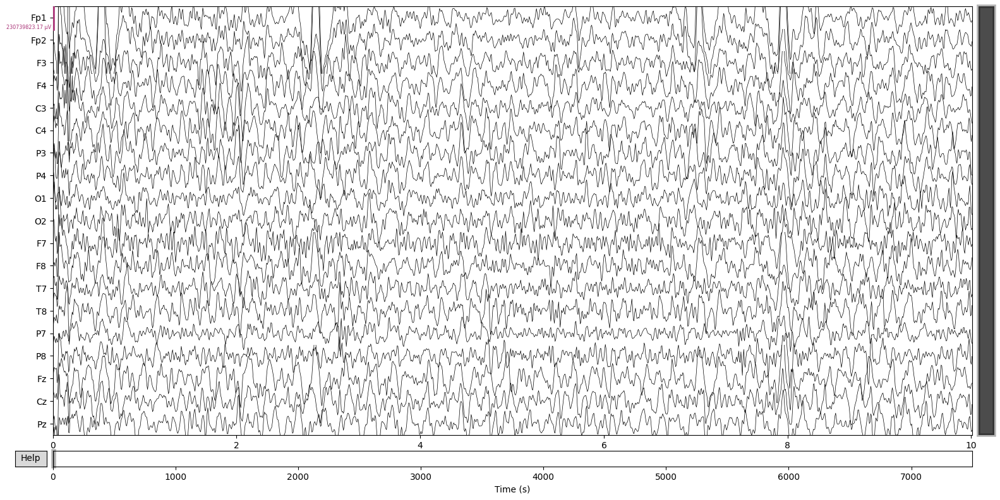

In [16]:
raw_adhd_filtered.plot(scalings='auto')

In [17]:
from mne.preprocessing import ICA

# Initialize ICA
ica_normal = ICA(n_components=19, random_state=42)

# Fit ICA to the preprocessed data
ica_normal.fit(raw_normal_filtered)


Fitting ICA to data using 19 channels (please be patient, this may take a while)
Selecting by number: 19 components
Fitting ICA took 13.2s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,41 iterations on raw data (959314 samples)
ICA components,19
Available PCA components,19
Channel types,eeg
ICA components marked for exclusion,—


In [18]:
# Identify components related to ocular artifacts
eog_inds, scores = ica_normal.find_bads_eog(raw_normal_filtered, ch_name=['Fp1','Fp2','F7','F8'], threshold=3)
print(eog_inds)

Using EOG channels: Fp1, Fp2, F7, F8
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 samples (10.000 s)

... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 1280 sam

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.5s


[0]


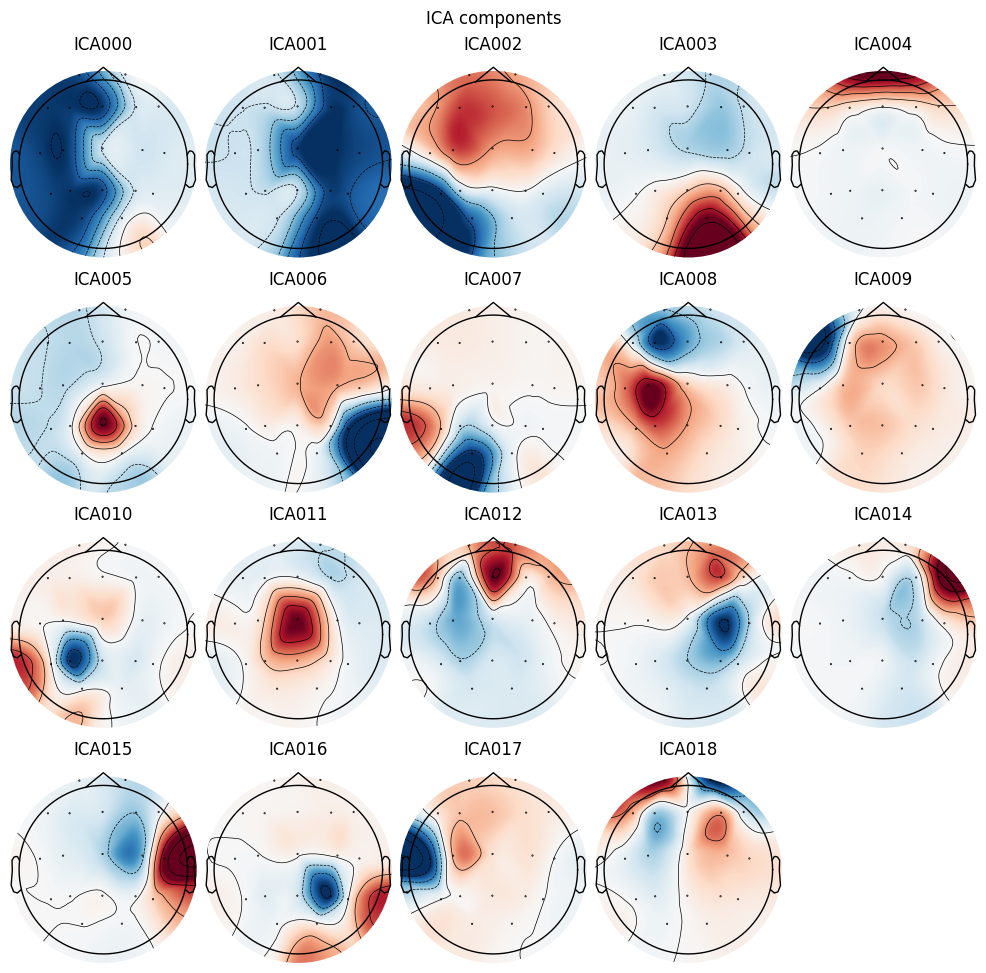

Creating RawArray with float64 data, n_channels=19, n_times=959314
    Range : 0 ... 959313 =      0.000 ...  7494.633 secs
Ready.


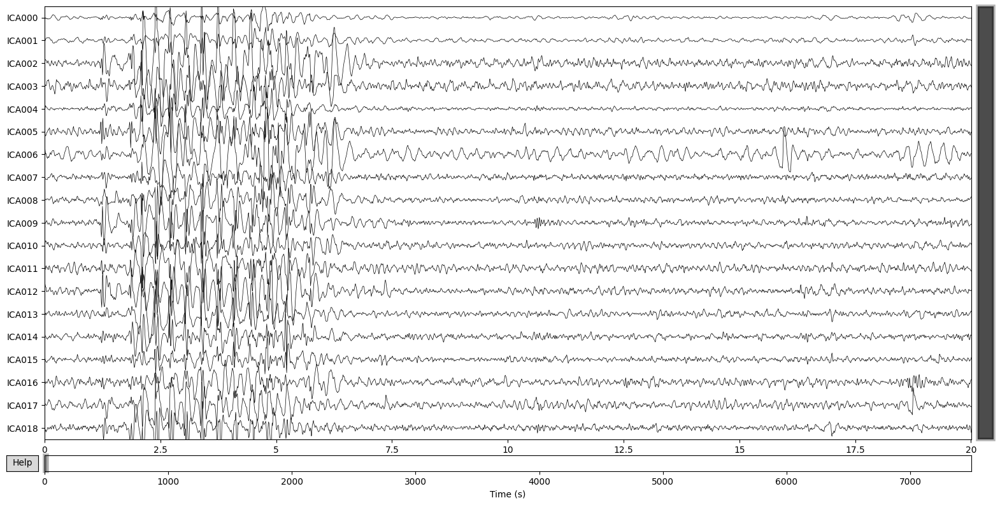

<Figure size 640x480 with 0 Axes>

In [19]:
# Plot ICA components in topographic maps
ica_normal.plot_components()

# Plot ICA components in waveform
ica_normal.plot_sources(raw_normal_filtered)
plt.set_cmap('viridis')  # Change 'viridis' to your desired colorscale
plt.show()

In [20]:
# Exclude identified components from the ICA decomposition
ica_normal.exclude = [2,4,17, 13, 12,18]

# Apply ICA to remove ocular artifacts
cleaned_raw_normal = raw_normal_filtered.copy()
cleaned_eeg_normal = ica_normal.apply(cleaned_raw_normal)

Applying ICA to Raw instance
    Transforming to ICA space (19 components)
    Zeroing out 6 ICA components
    Projecting back using 19 PCA components


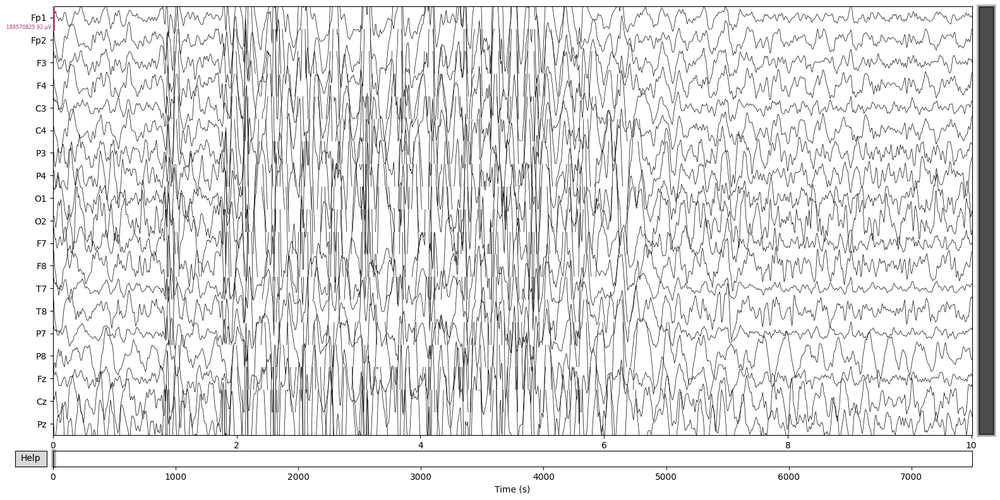

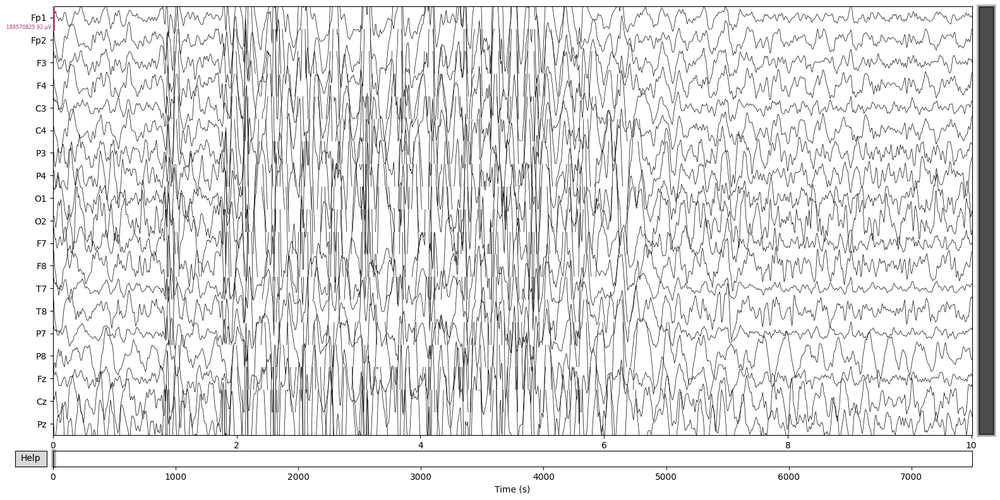

In [21]:
import mne
mne.set_config('MNE_BROWSE_RAW_SIZE','16,8')  
cleaned_eeg_normal.plot(scalings='auto')

In [22]:
from mne.preprocessing import ICA

# Initialize ICA
ica_adhd = ICA(n_components=19, random_state=42)

# Fit ICA to the preprocessed data
ica_adhd.fit(raw_adhd_filtered)

Fitting ICA to data using 19 channels (please be patient, this may take a while)
Selecting by number: 19 components
Fitting ICA took 18.7s.


Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,61 iterations on raw data (959314 samples)
ICA components,19
Available PCA components,19
Channel types,eeg
ICA components marked for exclusion,—


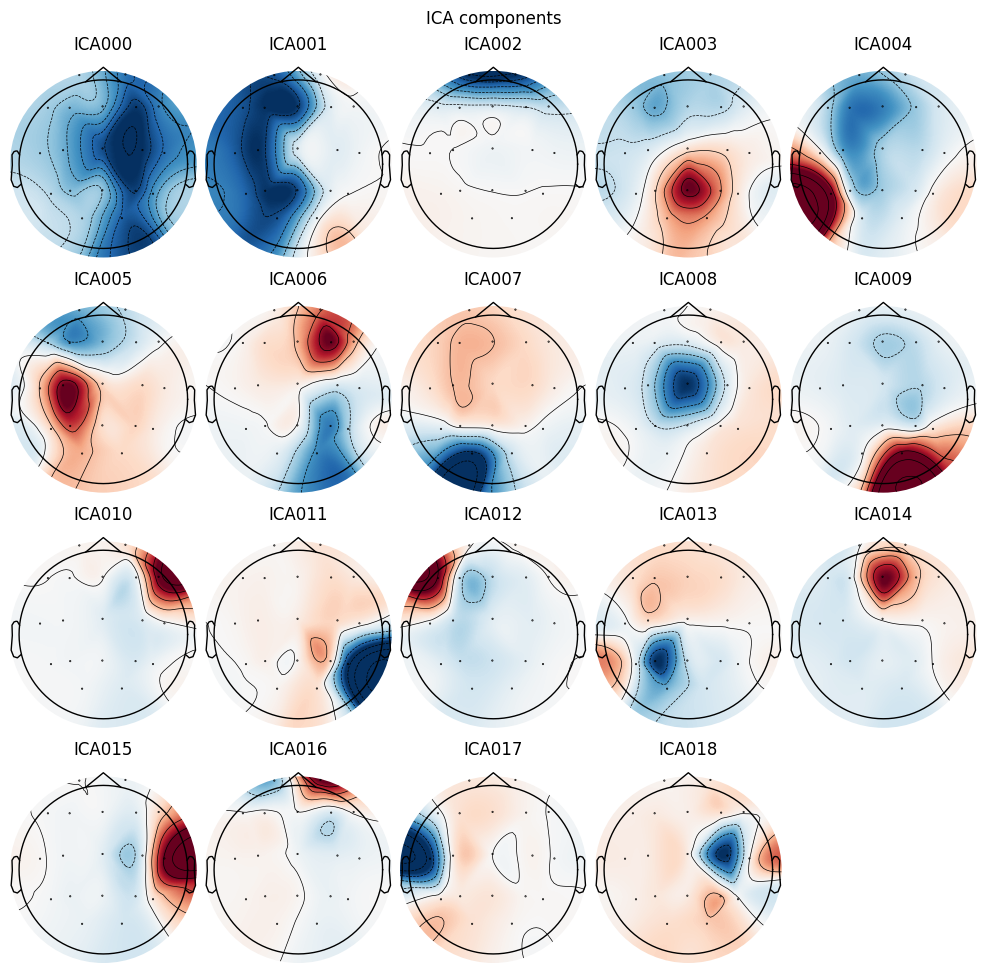

Creating RawArray with float64 data, n_channels=19, n_times=959314
    Range : 0 ... 959313 =      0.000 ...  7494.633 secs
Ready.


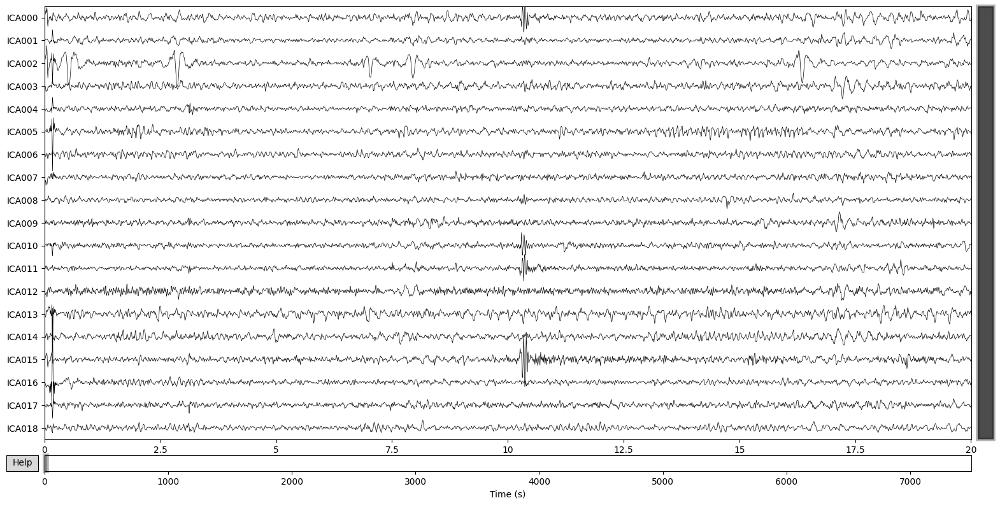

<Figure size 640x480 with 0 Axes>

In [23]:
# Plot ICA components in topographic maps
ica_adhd.plot_components()

# Plot ICA components in waveform
ica_adhd.plot_sources(raw_adhd_filtered)
plt.set_cmap('viridis')  # Change 'viridis' to your desired colorscale
plt.show()

In [24]:
# Exclude identified components from the ICA decomposition
ica_adhd.exclude = [6,10,14,16]

# Apply ICA to remove ocular artifacts
cleaned_raw_adhd = raw_adhd_filtered.copy()
cleaned_eeg_adhd = ica_adhd.apply(cleaned_raw_adhd)


Applying ICA to Raw instance
    Transforming to ICA space (19 components)
    Zeroing out 4 ICA components
    Projecting back using 19 PCA components


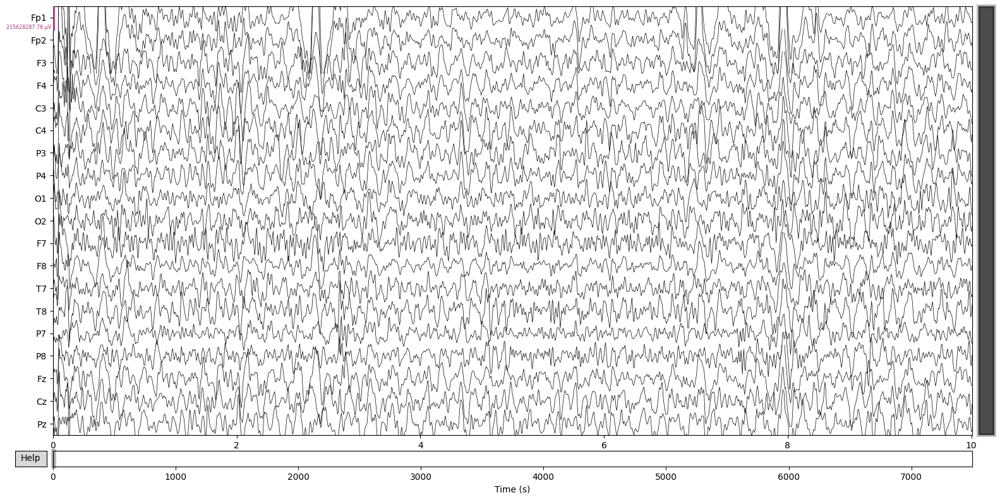

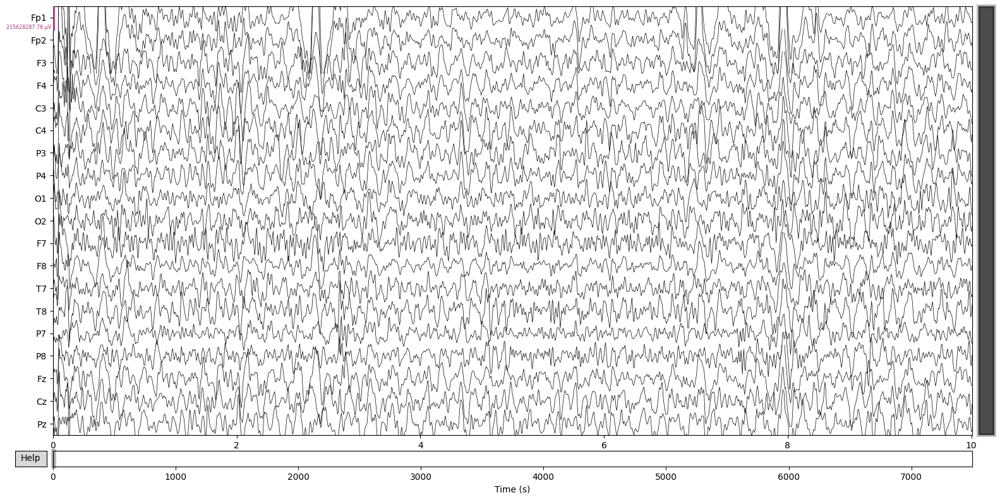

In [25]:
cleaned_eeg_adhd.plot(scalings='auto')

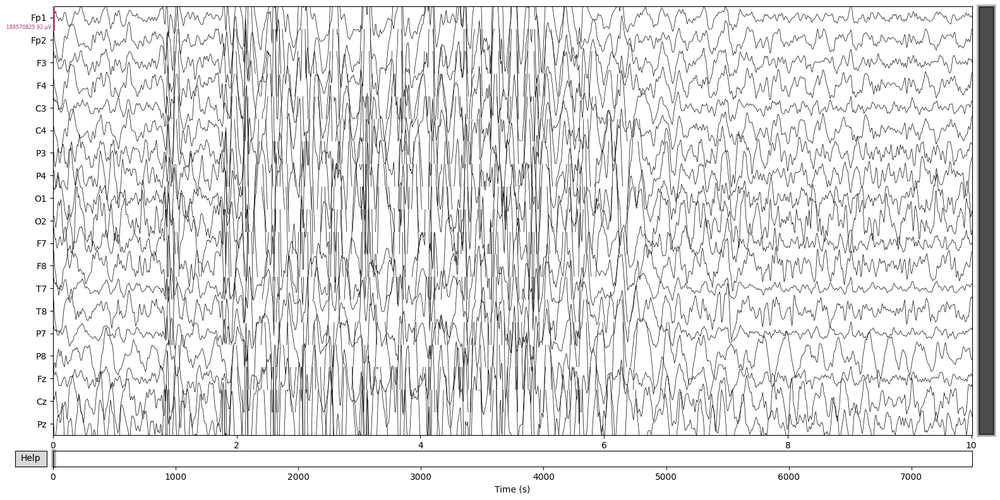

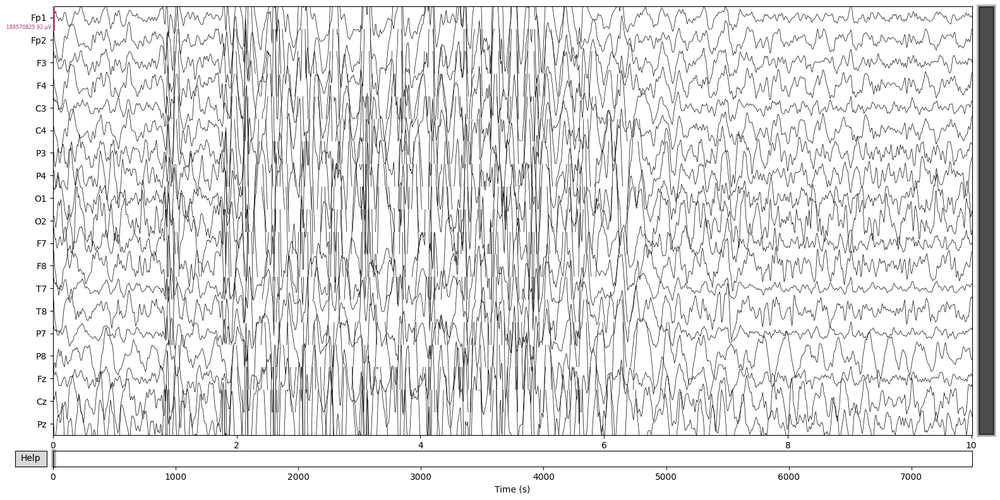

In [26]:
cleaned_eeg_normal.plot(scalings='auto')

In [27]:
eeg_normal = cleaned_eeg_normal.get_data()
eeg_normal_df = pd.DataFrame(eeg_normal.T, columns = channel_names,index=None)

In [28]:
eeg_normal_df.head()

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz
0,0.000124,0.000976,-0.000484,-0.000334,-0.000558,-0.000389,0.000011,-0.000145,0.000445,0.000041,-0.000145,0.000176,-0.000413,-0.000178,0.000603,-0.000012,0.000144,-0.000414,-0.000095
1,96.897254,70.862330,91.973564,48.871274,86.170398,31.015783,6.847051,44.224545,93.632978,38.918256,141.555957,131.022961,88.330912,91.292278,63.369345,-125.938706,70.462463,38.252415,-10.049016
2,50.262792,20.024262,42.213468,7.959290,57.298662,-4.318453,-87.515763,19.770852,71.056121,26.689716,66.572171,26.341484,48.485413,-17.001272,32.788711,-59.232168,28.947928,10.599932,-121.358931
3,38.089645,-34.100733,39.284513,-40.504919,52.184052,-38.341570,-119.502746,-61.278241,77.230282,-31.252951,29.344219,-53.425885,35.003215,-102.044243,21.310938,-56.162470,30.917216,44.485255,-143.115024
4,51.955726,-54.258726,63.617503,-57.217669,66.392088,-45.654509,-84.641296,-103.675151,99.104477,-58.356194,37.330437,-74.059140,46.540283,-120.642534,30.399290,-100.762030,56.070256,82.192786,-86.361821


In [29]:
eeg_adhd = cleaned_eeg_adhd.get_data()
eeg_adhd_df = pd.DataFrame(eeg_adhd.T, columns = channel_names, index=None)

In [30]:
eeg_adhd_df.head()

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz
0,0.000355,-0.000737,-0.000081,0.000095,-0.000095,0.000039,-0.000104,0.000019,-0.000066,0.000005,-0.000053,0.000441,-0.000086,0.000063,-0.000065,0.000031,0.000237,-0.000017,-0.000061
1,-285.729311,-312.393701,-193.494422,-248.723150,-141.028321,-200.069652,-32.347591,-168.005792,274.963454,42.804603,-211.397512,-176.257751,-93.569179,-131.509125,-78.895713,-163.994797,-212.335716,-193.715756,-100.093180
2,-270.487915,-286.010266,-129.616961,-165.457436,-83.240416,-137.213352,47.909742,-81.758344,187.658070,-24.222578,-200.803839,-131.230658,-48.788573,-69.498108,-31.789733,-123.759097,-130.922893,-147.677954,-37.299691
3,-398.355379,-469.860592,-152.574200,-273.974186,-121.802537,-232.354095,-44.530874,-249.392016,18.618139,-215.081485,-235.750822,-211.676125,-55.730548,-95.014211,-60.058088,-147.054312,-171.058160,-241.468114,-175.613966
4,-452.776639,-548.932062,-168.156838,-337.753161,-190.510394,-300.173032,-217.175931,-394.165414,-37.885249,-233.282251,-182.040668,-247.658138,-66.431189,-117.069381,-88.706655,-151.295547,-223.671469,-294.015031,-337.234318


In [31]:
eeg_df = pd.concat([eeg_normal_df,eeg_adhd_df], axis = 0)

In [32]:
eeg_df.reset_index(drop=True, inplace=True)

In [33]:
eeg_df.head()

,Fp1,Fp2,F3,F4,C3,C4,P3,P4,O1,O2,F7,F8,T7,T8,P7,P8,Fz,Cz,Pz
0,0.000124,0.000976,-0.000484,-0.000334,-0.000558,-0.000389,0.000011,-0.000145,0.000445,0.000041,-0.000145,0.000176,-0.000413,-0.000178,0.000603,-0.000012,0.000144,-0.000414,-0.000095
1,96.897254,70.862330,91.973564,48.871274,86.170398,31.015783,6.847051,44.224545,93.632978,38.918256,141.555957,131.022961,88.330912,91.292278,63.369345,-125.938706,70.462463,38.252415,-10.049016
2,50.262792,20.024262,42.213468,7.959290,57.298662,-4.318453,-87.515763,19.770852,71.056121,26.689716,66.572171,26.341484,48.485413,-17.001272,32.788711,-59.232168,28.947928,10.599932,-121.358931
3,38.089645,-34.100733,39.284513,-40.504919,52.184052,-38.341570,-119.502746,-61.278241,77.230282,-31.252951,29.344219,-53.425885,35.003215,-102.044243,21.310938,-56.162470,30.917216,44.485255,-143.115024
4,51.955726,-54.258726,63.617503,-57.217669,66.392088,-45.654509,-84.641296,-103.675151,99.104477,-58.356194,37.330437,-74.059140,46.540283,-120.642534,30.399290,-100.762030,56.070256,82.192786,-86.361821


In [34]:
class_values = data['class']

In [35]:
eeg_df = pd.concat([eeg_df,class_values],axis = 1)

In [36]:
eeg_df.shape

(1918628, 20)

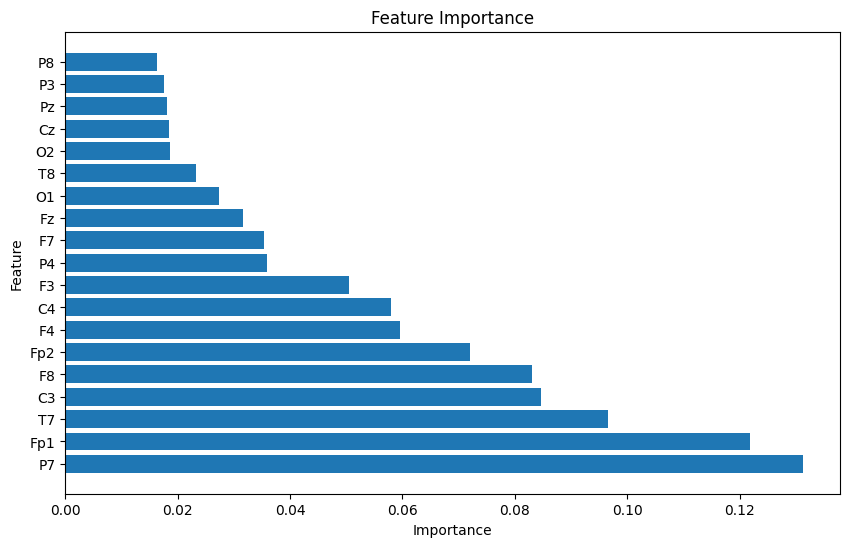

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import RandomForestClassifier

# Assuming you have your dataset loaded into a DataFrame named df
# X contains your features, and y contains your target variable
X = eeg_df.drop(columns=['class']).sample(n=100000, random_state=42)  # Assuming 'class' is your target variable
y = eeg_df['class'].sample(n=100000, random_state=42)

# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier()

# Fit the classifier to your data
rf_classifier.fit(X, y)

# Get feature importances
feature_importances = rf_classifier.feature_importances_

# Create a DataFrame to store feature importances along with feature names
feature_importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})

# Sort the DataFrame by importance values
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plotting feature importances
plt.figure(figsize=(10, 6))
plt.barh(feature_importance_df['Feature'], feature_importance_df['Importance'])
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.title('Feature Importance')
plt.show()


# Multi-Head CNN with Transformer

In [38]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, Dropout, LayerNormalization, Permute, MultiHeadAttention, Reshape, Concatenate, GlobalAveragePooling1D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Separate features and labels
X = eeg_df.iloc[:, :-1].values  # Features (excluding the last column)
y = eeg_df.iloc[:, -1].values   # Labels (last column)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data to match the expected shape for Conv1D
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)

# Define model architecture
input_shape = (X_train.shape[1], 1)

# Input layer
inputs = Input(shape=input_shape)

# CNN branch
cnn_conv1 = Conv1D(filters=32, kernel_size=3, activation='relu')(inputs)
cnn_pool1 = MaxPooling1D(pool_size=2)(cnn_conv1)
cnn_conv2 = Conv1D(filters=64, kernel_size=3, activation='relu')(cnn_pool1)
cnn_pool2 = MaxPooling1D(pool_size=2)(cnn_conv2)
cnn_flatten = Flatten()(cnn_pool2)

# Transformer-like branch
transformer_reshape = Reshape((-1, 19))(inputs)  # Reshape to match the number of channels
transformer_permute = Permute((2, 1))(transformer_reshape)  # Required for MultiHeadAttention
transformer_attention = MultiHeadAttention(num_heads=8, key_dim=19)(transformer_permute, transformer_permute)  # Adjust key_dim accordingly
transformer_attention_output = LayerNormalization()(transformer_attention)
transformer_output = Flatten()(transformer_attention_output)

# Concatenate CNN and Transformer outputs
concatenated_outputs = Concatenate()([cnn_flatten, transformer_output])

# Fully connected layers
fc_output = Dense(128, activation='relu')(concatenated_outputs)
dropout_fc = Dropout(0.5)(fc_output)

# Output layer
outputs = Dense(1, activation='sigmoid')(dropout_fc)  # Adjust output units and activation function as needed

# Create model
model = Model(inputs=inputs, outputs=outputs)

# Compile model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

2024-04-28 16:41:56.120768: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-28 16:41:56.120892: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-28 16:41:56.257146: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 19, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 17, 32)    │        128 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 1, 19)     │          0 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d       │ (None, 8, 32)     │          0 │ conv1d[0][0]      │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ permute (Permute)   │ (None, 19, 1)     │          0 │ reshape[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 6, 64)     │      6,208 │ max_pooling1d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 19, 1)     │      1,065 │ permute[0][0],    │
│ (MultiHeadAttentio… │                   │            │ permute[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_1     │ (None, 3, 64)     │          0 │ conv1d_1[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 19, 1)     │          2 │ multi_head_atten… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 192)       │          0 │ max_pooling1d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 19)        │          0 │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 211)       │          0 │ flatten[0][0],    │
│ (Concatenate)       │                   │            │ flatten_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     27,136 │ concatenate[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 128)       │          0 │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 1)         │        129 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 34,668 (135.42 KB)

 Trainable params: 34,668 (135.42 KB)

 Non-trainable params: 0 (0.00 B)

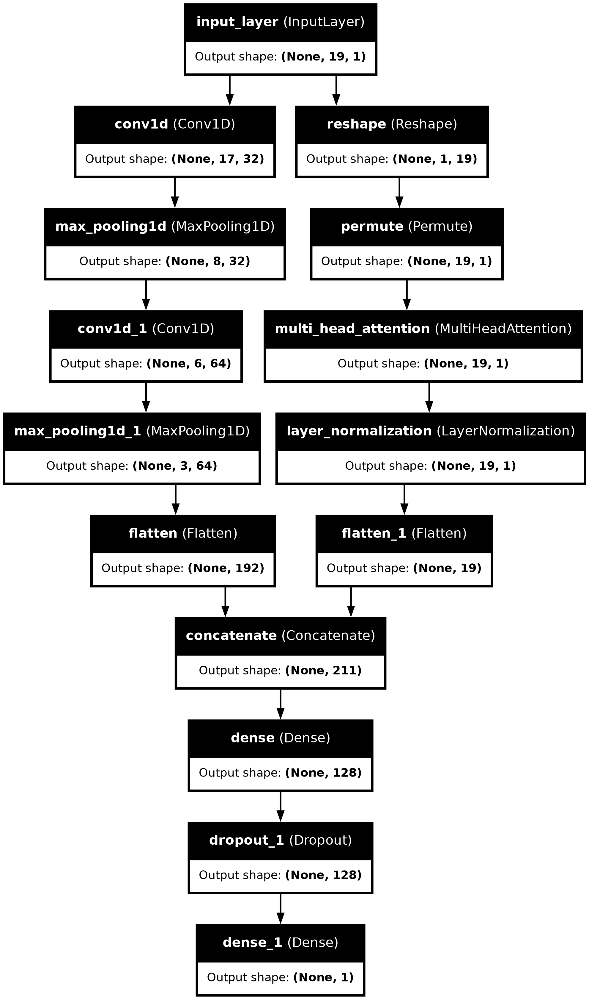

In [39]:
from tensorflow.keras.utils import plot_model

# Plot the model architecture
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

In [40]:
# Train model
history = model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_val, y_val))

# Evaluate model
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

Epoch 1/10
   51/23983 ━━━━━━━━━━━━━━━━━━━━ 1:14 3ms/step - accuracy: 0.5531 - loss: 3.3230

I0000 00:00:1714322536.445184      74 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


23983/23983 ━━━━━━━━━━━━━━━━━━━━ 84s 3ms/step - accuracy: 0.9300 - loss: 0.1969 - val_accuracy: 0.9898 - val_loss: 0.0310
Epoch 2/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 73s 3ms/step - accuracy: 0.9851 - loss: 0.0476 - val_accuracy: 0.9906 - val_loss: 0.0310
Epoch 3/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 73s 3ms/step - accuracy: 0.9886 - loss: 0.0379 - val_accuracy: 0.9933 - val_loss: 0.0223
Epoch 4/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 73s 3ms/step - accuracy: 0.9900 - loss: 0.0345 - val_accuracy: 0.9930 - val_loss: 0.0216
Epoch 5/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 75s 3ms/step - accuracy: 0.9907 - loss: 0.0320 - val_accuracy: 0.9945 - val_loss: 0.0196
Epoch 6/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 75s 3ms/step - accuracy: 0.9914 - loss: 0.0307 - val_accuracy: 0.9934 - val_loss: 0.0211
Epoch 7/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 75s 3ms/step - accuracy: 0.9920 - loss: 0.0291 - val_accuracy: 0.9936 - val_loss: 0.0242
Epoch 8/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 75s 3ms/step - accuracy: 0.9923 - lo

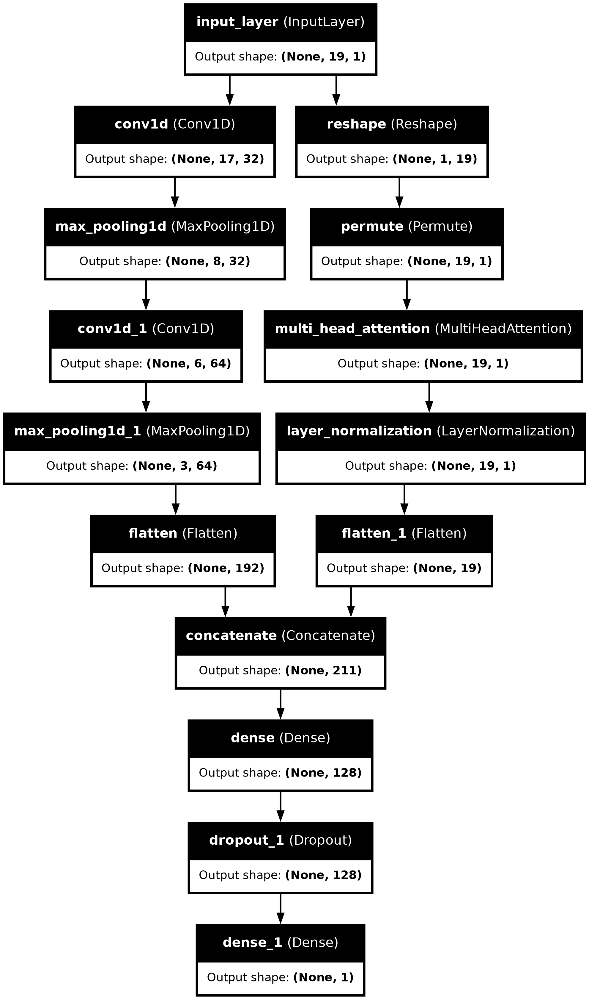

In [41]:
from tensorflow.keras.utils import plot_model

# Plot the model architecture
plot_model(model, to_file='model_architecture.png', show_shapes=True, show_layer_names=True)

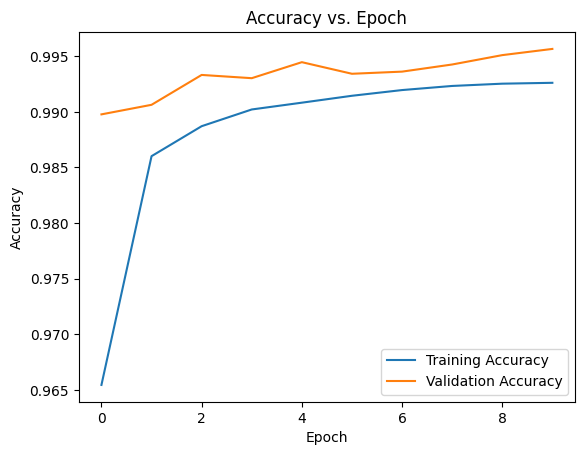

In [42]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epoch')
plt.legend()
plt.show()

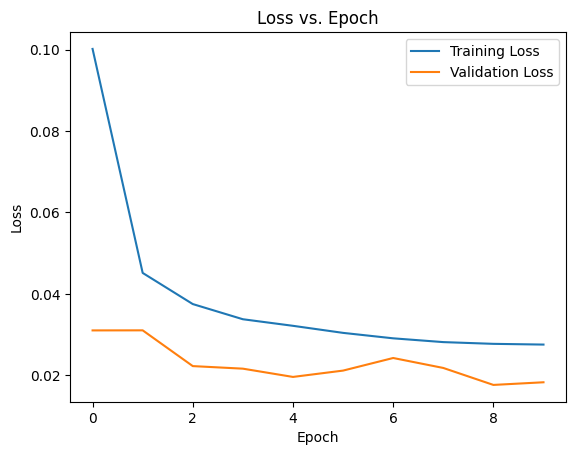

In [43]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.show()

In [44]:
from sklearn.metrics import classification_report,accuracy_score
y_pred = model.predict([X_val])
y_pred_binary = (y_pred > 0.5).astype(int)
print("Classification Report:")
print(classification_report(y_val, y_pred_binary))
print(accuracy_score(y_val, y_pred_binary))

11992/11992 ━━━━━━━━━━━━━━━━━━━━ 19s 2ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    192000
           1       1.00      0.99      1.00    191726

    accuracy                           1.00    383726
   macro avg       1.00      1.00      1.00    383726
weighted avg       1.00      1.00      1.00    383726

0.9956557543663969


In [45]:
from sklearn.metrics import mean_squared_error, precision_score, recall_score, f1_score
from math import sqrt

#calculate RMSE
print(sqrt(mean_squared_error(y_val, y_pred_binary)))
print(precision_score(y_val, y_pred_binary, average='binary'))
print(recall_score(y_val, y_pred_binary, average='binary'))
print(f1_score(y_val, y_pred_binary, average='binary'))

0.06591089161590172
0.9982958329182157
0.9930004276936879
0.9956410893354426


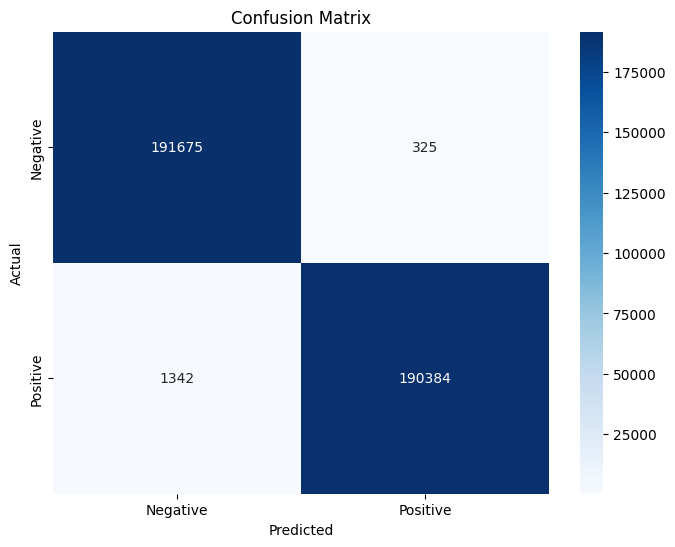

In [46]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_val, y_pred_binary)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# RNN + Transformer

In [47]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, LayerNormalization, Concatenate, MultiHeadAttention, GlobalAveragePooling1D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Separate features and labels
X = eeg_df.iloc[:, :-1].values  # Features (excluding the last column)
y = eeg_df.iloc[:, -1].values   # Labels (last column)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data to match the expected shape for RNN
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)

# Define model architecture
input_shape = (X_train.shape[1], 1)

# Input layer for RNN (LSTM)
inputs = Input(shape=input_shape)

# RNN (LSTM) layer
lstm_output = LSTM(64, return_sequences=True)(inputs)
lstm_output = LSTM(64)(lstm_output)

# LayerNormalization for Transformer-like component
transformer_inputs = LayerNormalization()(inputs)

# Multi-Head Self-Attention layer for Transformer-like component
attention_output = MultiHeadAttention(num_heads=8, key_dim=64)(transformer_inputs, transformer_inputs)
attention_output = LayerNormalization(epsilon=1e-6)(attention_output + transformer_inputs)

# Global Average Pooling for Transformer-like component
transformer_pooling_output = GlobalAveragePooling1D()(attention_output)

# Concatenate outputs from RNN and Transformer-like component
concatenated_outputs = Concatenate()([lstm_output, transformer_pooling_output])

# Fully connected layers
fc_output = Dense(128, activation='relu')(concatenated_outputs)
dropout_fc = Dropout(0.5)(fc_output)

# Output layer
outputs = Dense(1, activation='sigmoid')(dropout_fc)  # Adjust output units and activation function as needed

# Create model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Train the model
batch_size = 64
num_epochs = 25

# Training
history = model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_data=(X_val, y_val))

# Evaluate on validation data
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 19, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 19, 1)     │          2 │ input_layer_1[0]… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 19, 1)     │      3,585 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 19, 1)     │          0 │ multi_head_atten… │
│                     │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 19, 64)    │     16,896 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 19, 1)     │          2 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_1 (LSTM)       │ (None, 64)        │     33,024 │ lstm[0][0]        │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1)         │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 65)        │          0 │ lstm_1[0][0],     │
│ (Concatenate)       │                   │            │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 128)       │      8,448 │ concatenate_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 128)       │          0 │ dense_2[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 1)         │        129 │ dropout_3[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 62,086 (242.52 KB)

 Trainable params: 62,086 (242.52 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 251s 10ms/step - accuracy: 0.6860 - loss: 0.5591 - val_accuracy: 0.8201 - val_loss: 0.3856
Epoch 2/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 241s 10ms/step - accuracy: 0.8377 - loss: 0.3600 - val_accuracy: 0.8831 - val_loss: 0.2765
Epoch 3/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 261s 10ms/step - accuracy: 0.8916 - loss: 0.2636 - val_accuracy: 0.9165 - val_loss: 0.2095
Epoch 4/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 242s 10ms/step - accuracy: 0.9217 - loss: 0.2012 - val_accuracy: 0.9325 - val_loss: 0.1727
Epoch 5/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 256s 10ms/step - accuracy: 0.9429 - loss: 0.1533 - val_accuracy: 0.9557 - val_loss: 0.1209
Epoch 6/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 235s 10ms/step - accuracy: 0.9571 - loss: 0.1191 - val_accuracy: 0.9672 - val_loss: 0.0908
Epoch 7/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 234s 10ms/step - accuracy: 0.9663 - loss: 0.0952 - val_accuracy: 0.9730 - val_loss: 0.0752
Epoch 8/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 234s 10ms/s

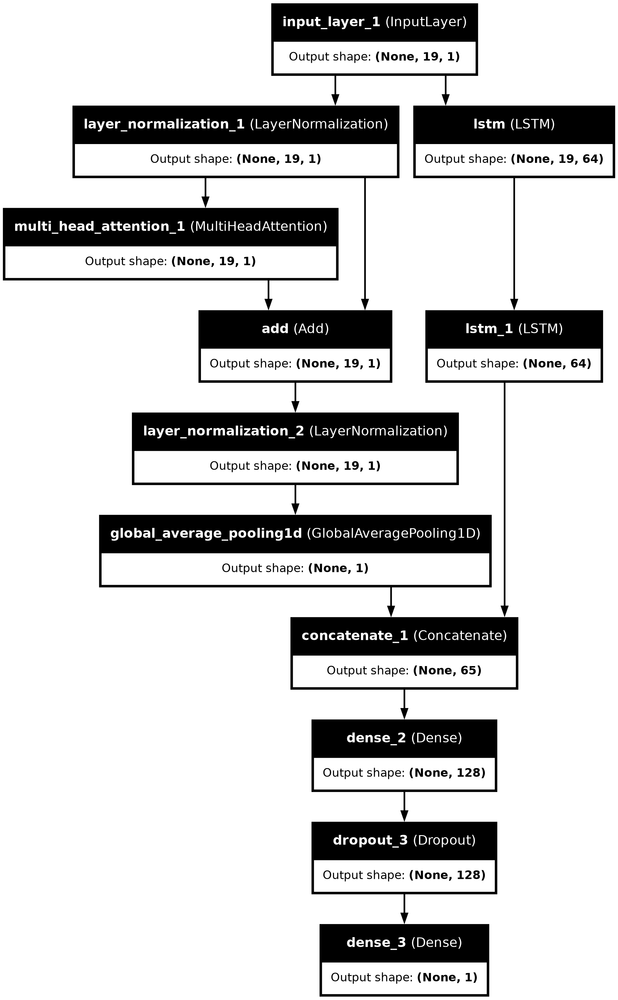

In [48]:
from tensorflow.keras.utils import plot_model

# Plot the model architecture
plot_model(model, to_file='RNN_Transformer.png', show_shapes=True, show_layer_names=True)


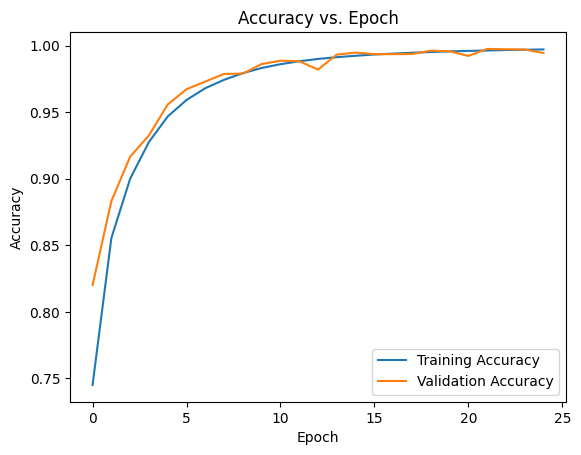

In [49]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epoch')
plt.legend()
plt.show()

In [50]:
from sklearn.metrics import classification_report, accuracy_score
y_pred = model.predict([X_val])
y_pred_binary = (y_pred > 0.5).astype(int)
print("Classification Report:")
print(classification_report(y_val, y_pred_binary))
print(accuracy_score(y_val, y_pred_binary))

11992/11992 ━━━━━━━━━━━━━━━━━━━━ 30s 2ms/step
Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    192000
           1       1.00      0.99      0.99    191726

    accuracy                           0.99    383726
   macro avg       0.99      0.99      0.99    383726
weighted avg       0.99      0.99      0.99    383726

0.9943918316715573


In [51]:
from sklearn.metrics import mean_squared_error, precision_score, recall_score, f1_score
from math import sqrt

#calculate RMSE
print(sqrt(mean_squared_error(y_val, y_pred_binary)))
print(precision_score(y_val, y_pred_binary, average='binary'))
print(recall_score(y_val, y_pred_binary, average='binary'))
print(f1_score(y_val, y_pred_binary, average='binary'))

0.07488770478818729
0.9965790025146689
0.9921815507547229
0.9943754149176961


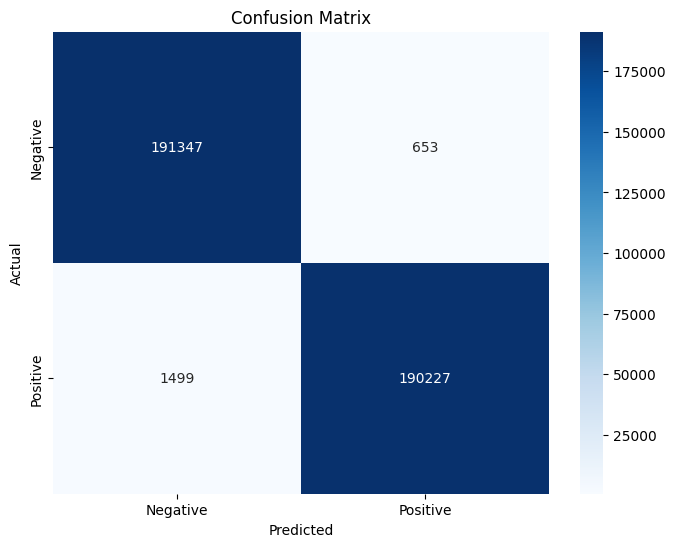

In [52]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_val, y_pred_binary)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

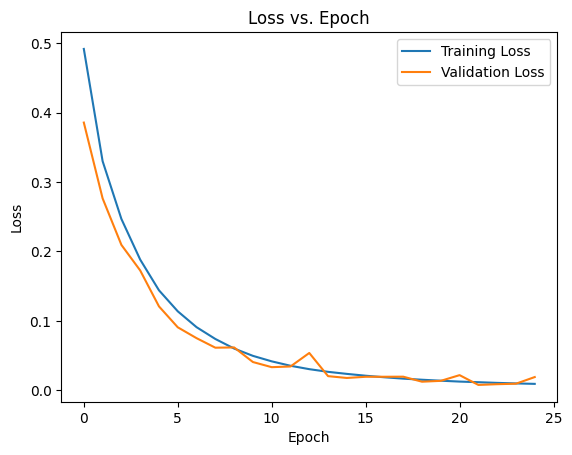

In [53]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.show()

# GRU + Transformer

In [54]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, GRU, Dense, Dropout, LayerNormalization, Concatenate, MultiHeadAttention, GlobalAveragePooling1D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Custom Positional Encoding Layer for Transformer-like component
class PositionalEncoding1D(tf.keras.layers.Layer):
    def __init__(self, input_dim, **kwargs):
        super(PositionalEncoding1D, self).__init__(**kwargs)
        self.pos_encoding = self.positional_encoding(input_dim, 64)  # Adjust 64 as needed

    def positional_encoding(self, position, d_model):
        angle_rads = self.get_angles(np.arange(position)[:, np.newaxis], np.arange(d_model)[np.newaxis, :], d_model)

        # Apply sine to even indices in the array; 2i
        angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])

        # Apply cosine to odd indices in the array; 2i+1
        angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])

        pos_encoding = angle_rads[np.newaxis, ...]

        return tf.cast(pos_encoding, dtype=tf.float32)

    def get_angles(self, position, i, d_model):
        angle_rates = 1 / np.power(10000, (2 * (i // 2)) / np.float32(d_model))
        return position * angle_rates

    def call(self, inputs):
        return inputs + self.pos_encoding

# Separate features and labels
X = eeg_df.iloc[:, :-1].values  # Features (excluding the last column)
y = eeg_df.iloc[:, -1].values   # Labels (last column)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data to match the expected shape for GRU
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)

# Define model architecture
input_shape = (X_train.shape[1], 1)

# Input layer for GRU
inputs = Input(shape=input_shape)

# GRU layer
gru_output = GRU(64, return_sequences=True)(inputs)
gru_output = GRU(64)(gru_output)

# LayerNormalization for Transformer-like component
transformer_inputs = LayerNormalization()(inputs)

# Multi-Head Self-Attention layer for Transformer-like component
attention_output = MultiHeadAttention(num_heads=8, key_dim=64)(transformer_inputs, transformer_inputs)
attention_output = LayerNormalization(epsilon=1e-6)(attention_output + transformer_inputs)

# Global Average Pooling for Transformer-like component
transformer_pooling_output = GlobalAveragePooling1D()(attention_output)

# Concatenate outputs from GRU and Transformer-like component
concatenated_outputs = Concatenate()([gru_output, transformer_pooling_output])

# Fully connected layers
fc_output = Dense(128, activation='relu')(concatenated_outputs)
dropout_fc = Dropout(0.5)(fc_output)

# Output layer
outputs = Dense(1, activation='sigmoid')(dropout_fc)  # Adjust output units and activation function as needed

# Create model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Train the model
batch_size = 64
num_epochs = 30

# Training
history = model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_data=(X_val, y_val))

# Evaluate on validation data
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")


Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 19, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 19, 1)     │          2 │ input_layer_2[0]… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 19, 1)     │      3,585 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 19, 1)     │          0 │ multi_head_atten… │
│                     │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru (GRU)           │ (None, 19, 64)    │     12,864 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 19, 1)     │          2 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_1 (GRU)         │ (None, 64)        │     24,960 │ gru[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 1)         │          0 │ layer_normalizat… │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_2       │ (None, 65)        │          0 │ gru_1[0][0],      │
│ (Concatenate)       │                   │            │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 128)       │      8,448 │ concatenate_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_5 (Dropout) │ (None, 128)       │          0 │ dense_4[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_5 (Dense)     │ (None, 1)         │        129 │ dropout_5[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 49,990 (195.27 KB)

 Trainable params: 49,990 (195.27 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/30
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 235s 10ms/step - accuracy: 0.6476 - loss: 0.5952 - val_accuracy: 0.8343 - val_loss: 0.3652
Epoch 2/30
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 231s 10ms/step - accuracy: 0.8509 - loss: 0.3356 - val_accuracy: 0.9183 - val_loss: 0.2060
Epoch 3/30
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 230s 10ms/step - accuracy: 0.9251 - loss: 0.1917 - val_accuracy: 0.9332 - val_loss: 0.1701
Epoch 4/30
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 231s 10ms/step - accuracy: 0.9569 - loss: 0.1179 - val_accuracy: 0.9739 - val_loss: 0.0717
Epoch 5/30
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 231s 10ms/step - accuracy: 0.9758 - loss: 0.0696 - val_accuracy: 0.9850 - val_loss: 0.0433
Epoch 6/30
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 264s 10ms/step - accuracy: 0.9849 - loss: 0.0457 - val_accuracy: 0.9917 - val_loss: 0.0256
Epoch 7/30
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 231s 10ms/step - accuracy: 0.9896 - loss: 0.0324 - val_accuracy: 0.9930 - val_loss: 0.0212
Epoch 8/30
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 244s 10ms/s

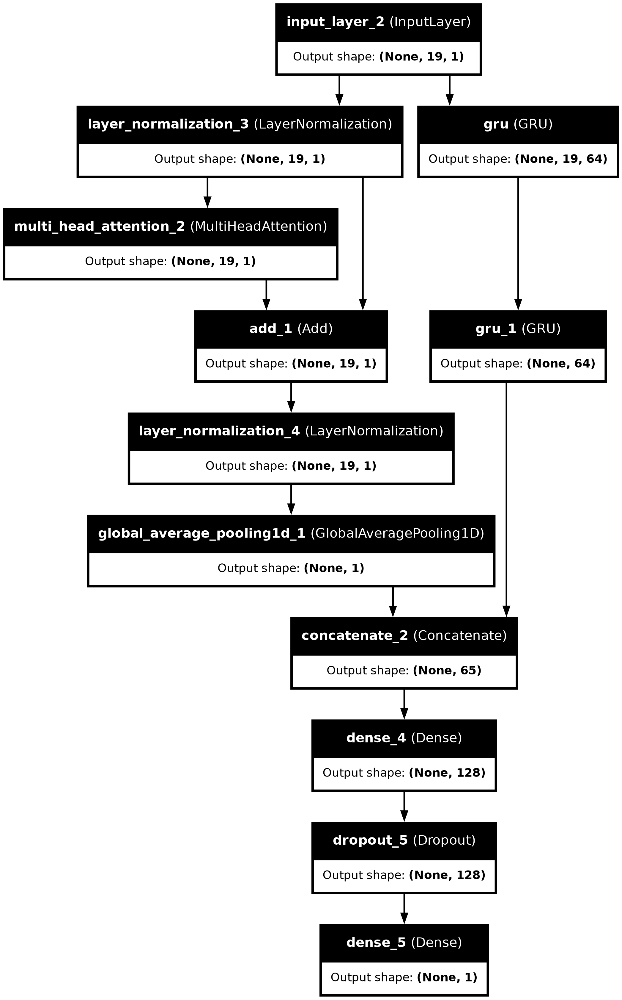

In [55]:
from tensorflow.keras.utils import plot_model

# Plot the model architecture
plot_model(model, to_file='GRU_Transformer.png', show_shapes=True, show_layer_names=True)

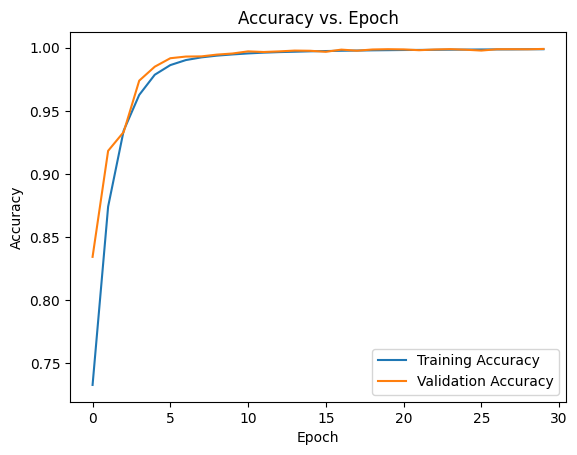

In [56]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epoch')
plt.legend()
plt.show()

In [57]:
from sklearn.metrics import classification_report
y_pred = model.predict([X_val])
y_pred_binary = (y_pred > 0.5).astype(int)
print("Classification Report:")
print(classification_report(y_val, y_pred_binary))

11992/11992 ━━━━━━━━━━━━━━━━━━━━ 30s 2ms/step
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    192000
           1       1.00      1.00      1.00    191726

    accuracy                           1.00    383726
   macro avg       1.00      1.00      1.00    383726
weighted avg       1.00      1.00      1.00    383726



In [58]:
from sklearn.metrics import mean_squared_error, precision_score, recall_score, f1_score
from math import sqrt

#calculate RMSE
print(sqrt(mean_squared_error(y_val, y_pred_binary)))
print(precision_score(y_val, y_pred_binary, average='binary'))
print(recall_score(y_val, y_pred_binary, average='binary'))
print(f1_score(y_val, y_pred_binary, average='binary'))

0.03054435087907141
0.999759740938055
0.9983726776754327
0.9990657278710601


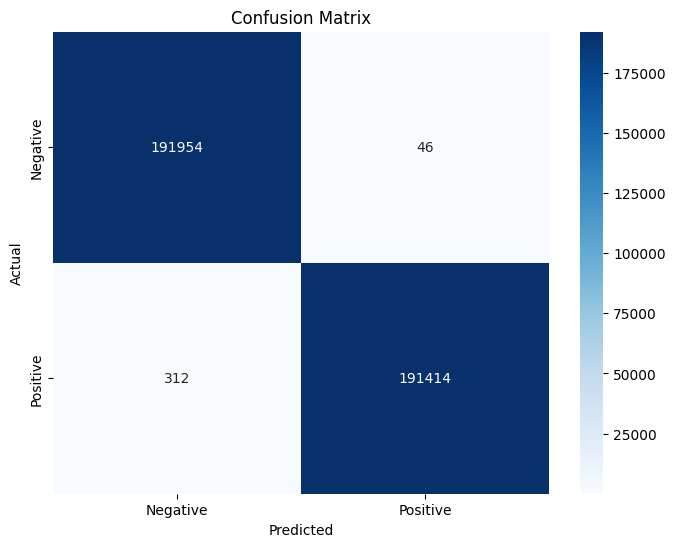

In [59]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_val, y_pred_binary)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

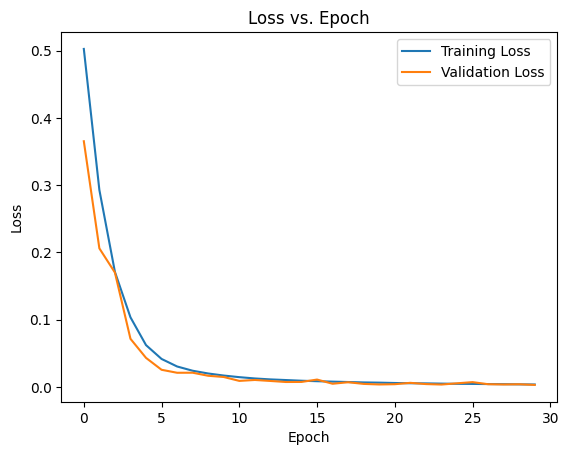

In [60]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.show()

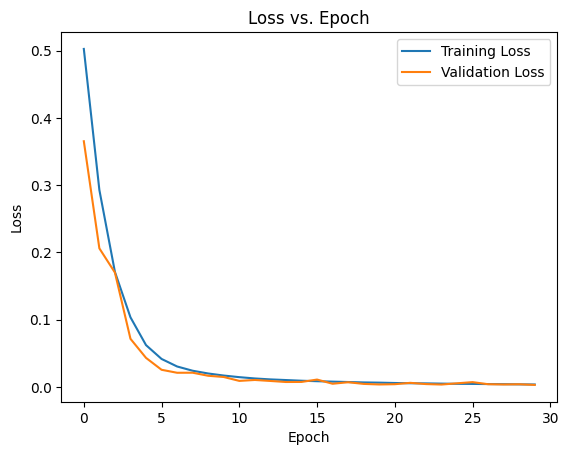

In [61]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.show()

# CNN + RNN 

In [62]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, LSTM, Dense, Dropout, LayerNormalization, Concatenate, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Separate features and labels
X = eeg_df.iloc[:, :-1].values  # Features (excluding the last column)
y = eeg_df.iloc[:, -1].values   # Labels (last column)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data to match the expected shape for RNN
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)

# Define model architecture
input_shape = (X_train.shape[1], 1)

# Input layer for RNN (LSTM)
inputs = Input(shape=input_shape)

# RNN (LSTM) layer
lstm_output = LSTM(64, return_sequences=True)(inputs)
lstm_output = LSTM(64)(lstm_output)

# CNN layers
conv1 = Conv1D(filters=32, kernel_size=3, activation='relu', padding='same')(inputs)
pool1 = MaxPooling1D(pool_size=2)(conv1)
conv2 = Conv1D(filters=64, kernel_size=3, activation='relu', padding='same')(pool1)
pool2 = MaxPooling1D(pool_size=2)(conv2)
conv3 = Conv1D(filters=128, kernel_size=3, activation='relu', padding='same')(pool2)
pool3 = MaxPooling1D(pool_size=2)(conv3)
conv4 = Conv1D(filters=256, kernel_size=3, activation='relu', padding='same')(pool3)
pool4 = MaxPooling1D(pool_size=2)(conv4)
flatten_cnn = Flatten()(pool4)

# Concatenate outputs from RNN and CNN
concatenated_outputs = Concatenate()([lstm_output, flatten_cnn])

# Fully connected layers
fc_output = Dense(128, activation='relu')(concatenated_outputs)
dropout_fc = Dropout(0.5)(fc_output)

# Output layer
outputs = Dense(1, activation='sigmoid')(dropout_fc)  # Adjust output units and activation function as needed

# Create model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Train the model
batch_size = 64
num_epochs = 25

# Training
history = model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_data=(X_val, y_val))

# Evaluate on validation data
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 19, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 19, 32)    │        128 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_2     │ (None, 9, 32)     │          0 │ conv1d_2[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 9, 64)     │      6,208 │ max_pooling1d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_3     │ (None, 4, 64)     │          0 │ conv1d_3[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_4 (Conv1D)   │ (None, 4, 128)    │     24,704 │ max_pooling1d_3[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_4     │ (None, 2, 128)    │          0 │ conv1d_4[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 2, 256)    │     98,560 │ max_pooling1d_4[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_2 (LSTM)       │ (None, 19, 64)    │     16,896 │ input_layer_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_5     │ (None, 1, 256)    │          0 │ conv1d_5[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_3 (LSTM)       │ (None, 64)        │     33,024 │ lstm_2[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_2 (Flatten) │ (None, 256)       │          0 │ max_pooling1d_5[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_3       │ (None, 320)       │          0 │ lstm_3[0][0],     │
│ (Concatenate)       │                   │            │ flatten_2[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_6 (Dense)     │ (None, 128)       │     41,088 │ concatenate_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_6 (Dropout) │ (None, 128)       │          0 │ dense_6[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_7 (Dense)     │ (None, 1)         │        129 │ dropout_6[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 220,737 (862.25 KB)

 Trainable params: 220,737 (862.25 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 226s 9ms/step - accuracy: 0.9063 - loss: 0.2187 - val_accuracy: 0.9898 - val_loss: 0.0301
Epoch 2/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 227s 9ms/step - accuracy: 0.9900 - loss: 0.0298 - val_accuracy: 0.9922 - val_loss: 0.0212
Epoch 3/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 222s 9ms/step - accuracy: 0.9948 - loss: 0.0162 - val_accuracy: 0.9957 - val_loss: 0.0130
Epoch 4/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 225s 9ms/step - accuracy: 0.9963 - loss: 0.0115 - val_accuracy: 0.9971 - val_loss: 0.0097
Epoch 5/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 221s 9ms/step - accuracy: 0.9971 - loss: 0.0092 - val_accuracy: 0.9975 - val_loss: 0.0082
Epoch 6/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 224s 9ms/step - accuracy: 0.9976 - loss: 0.0076 - val_accuracy: 0.9983 - val_loss: 0.0054
Epoch 7/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 222s 9ms/step - accuracy: 0.9979 - loss: 0.0065 - val_accuracy: 0.9975 - val_loss: 0.0084
Epoch 8/25
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 224s 9ms/step - ac

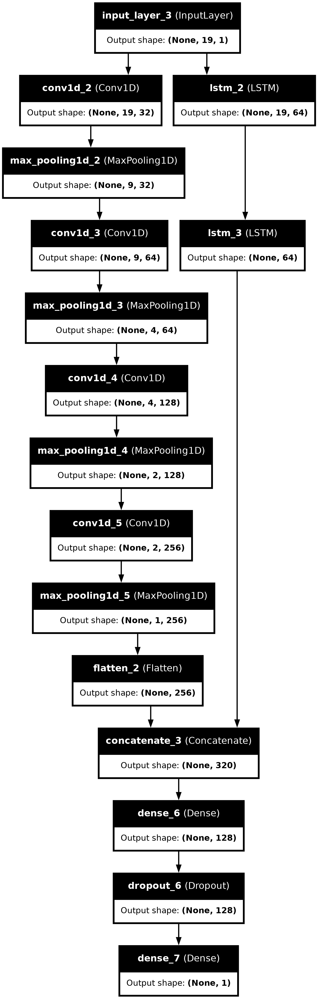

In [63]:
from tensorflow.keras.utils import plot_model

# Plot the model architecture
plot_model(model, to_file='CNN_RNN.png', show_shapes=True, show_layer_names=True)

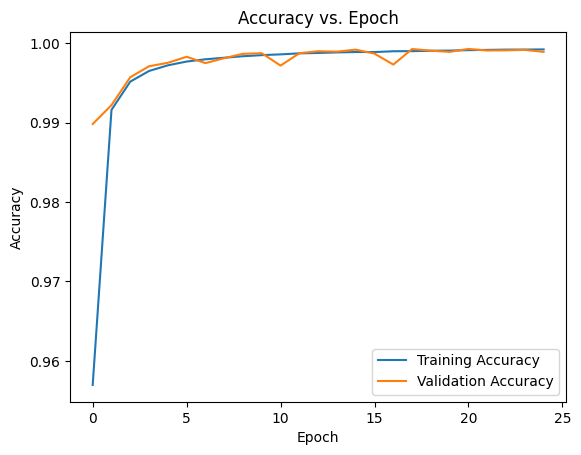

In [64]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs. Epoch')
plt.legend()
plt.show()

In [65]:
from sklearn.metrics import classification_report
y_pred = model.predict([X_val])
y_pred_binary = (y_pred > 0.5).astype(int)
print("Classification Report:")
print(classification_report(y_val, y_pred_binary))

11992/11992 ━━━━━━━━━━━━━━━━━━━━ 31s 3ms/step
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    192000
           1       1.00      1.00      1.00    191726

    accuracy                           1.00    383726
   macro avg       1.00      1.00      1.00    383726
weighted avg       1.00      1.00      1.00    383726



In [66]:
from sklearn.metrics import mean_squared_error, precision_score, recall_score, f1_score
from math import sqrt

#calculate RMSE
print(sqrt(mean_squared_error(y_val, y_pred_binary)))
print(precision_score(y_val, y_pred_binary, average='binary'))
print(recall_score(y_val, y_pred_binary, average='binary'))
print(f1_score(y_val, y_pred_binary, average='binary'))

0.033162373947278743
0.9998014421569652
0.9979971417543786
0.9988984771838604


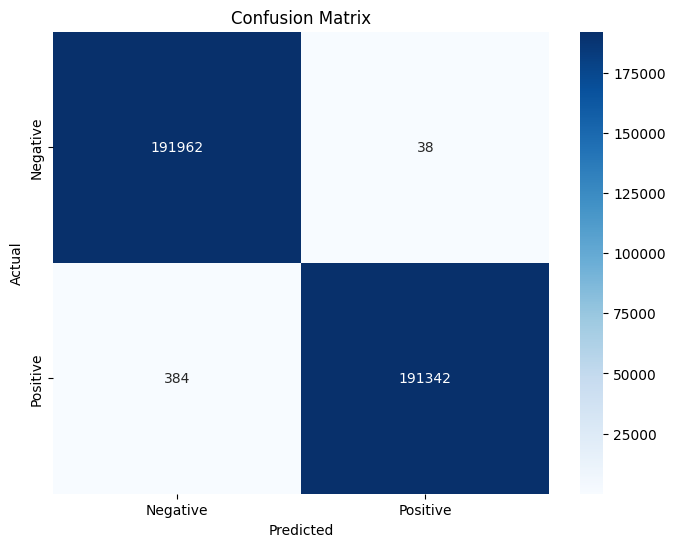

In [67]:
from sklearn.metrics import confusion_matrix
# Generate confusion matrix
cm = confusion_matrix(y_val, y_pred_binary)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

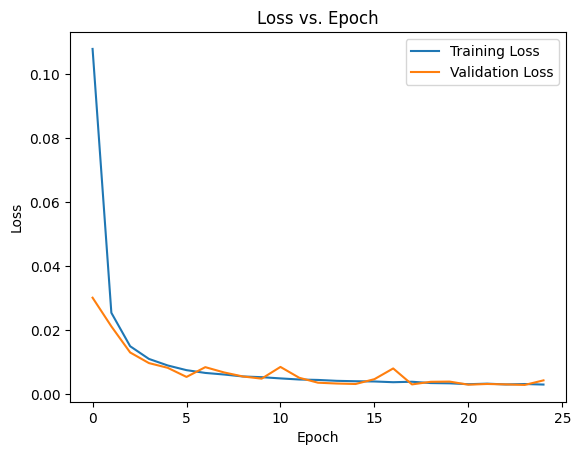

In [68]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.show()

# CNN + GRU

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 19, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 17, 32)    │        128 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_7 (Conv1D)   │ (None, 17, 32)    │        128 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_8 (Conv1D)   │ (None, 17, 32)    │        128 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_6     │ (None, 8, 32)     │          0 │ conv1d_6[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_7     │ (None, 8, 32)     │          0 │ conv1d_7[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_8     │ (None, 8, 32)     │          0 │ conv1d_8[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_3 (Flatten) │ (None, 256)       │          0 │ max_pooling1d_6[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_4 (Flatten) │ (None, 256)       │          0 │ max_pooling1d_7[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_5 (Flatten) │ (None, 256)       │          0 │ max_pooling1d_8[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_2 (GRU)         │ (None, 64)        │     12,864 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_3 (GRU)         │ (None, 64)        │     12,864 │ input_layer_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_4       │ (None, 768)       │          0 │ flatten_3[0][0],  │
│ (Concatenate)       │                   │            │ flatten_4[0][0],  │
│                     │                   │            │ flatten_5[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_5       │ (None, 128)       │          0 │ gru_2[0][0],      │
│ (Concatenate)       │                   │            │ gru_3[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_6       │ (None, 896)       │          0 │ concatenate_4[0]… │
│ (Concatenate)       │                   │            │ concatenate_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_8 (Dense)     │ (None, 128)       │    114,816 │ concatenate_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_7 (Dropout) │ (None, 128)       │          0 │ dense_8[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_9 (Dense)     │ (None, 1)         │        129 │ dropout_7[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 141,057 (551.00 KB)

 Trainable params: 141,057 (551.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 199s 8ms/step - accuracy: 0.9033 - loss: 0.3784 - val_accuracy: 0.9954 - val_loss: 0.0153
Epoch 2/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 199s 8ms/step - accuracy: 0.9906 - loss: 0.0328 - val_accuracy: 0.9973 - val_loss: 0.0093
Epoch 3/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 199s 8ms/step - accuracy: 0.9936 - loss: 0.0235 - val_accuracy: 0.9976 - val_loss: 0.0091
Epoch 4/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 195s 8ms/step - accuracy: 0.9948 - loss: 0.0196 - val_accuracy: 0.9986 - val_loss: 0.0053
Epoch 5/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 199s 8ms/step - accuracy: 0.9957 - loss: 0.0161 - val_accuracy: 0.9989 - val_loss: 0.0048
Epoch 6/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 200s 8ms/step - accuracy: 0.9960 - loss: 0.0155 - val_accuracy: 0.9989 - val_loss: 0.0042
Epoch 7/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 200s 8ms/step - accuracy: 0.9965 - loss: 0.0136 - val_accuracy: 0.9980 - val_loss: 0.0095
Epoch 8/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 194s 8ms/step - ac

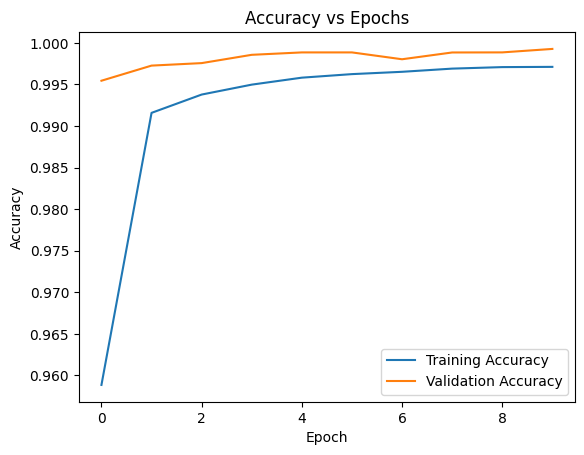

11992/11992 ━━━━━━━━━━━━━━━━━━━━ 27s 2ms/step
Confusion Matrix:


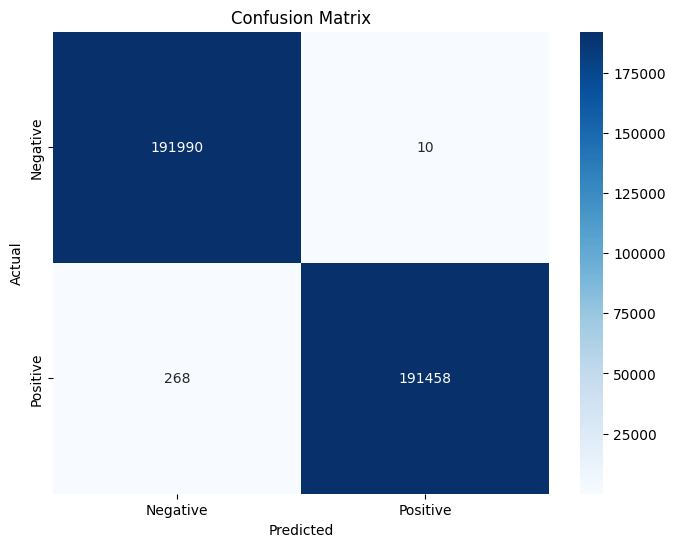

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    192000
           1       1.00      1.00      1.00    191726

    accuracy                           1.00    383726
   macro avg       1.00      1.00      1.00    383726
weighted avg       1.00      1.00      1.00    383726



In [69]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, Dropout, GRU, LayerNormalization, Concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

# Separate features and labels
X = eeg_df.iloc[:, :-1].values  # Features (excluding the last column)
y = eeg_df.iloc[:, -1].values   # Labels (last column)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data to match the expected shape for CNN
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)

# Define model architecture
input_shape = (X_train.shape[1], 1)

# Input layer
inputs = Input(shape=input_shape)

# CNN layers
cnn_heads = 3  # Number of CNN heads
cnn_outputs = []
for _ in range(cnn_heads):
    cnn_output = Conv1D(filters=32, kernel_size=3, activation='relu')(inputs)
    cnn_output = MaxPooling1D(pool_size=2)(cnn_output)
    cnn_output = Flatten()(cnn_output)
    cnn_outputs.append(cnn_output)

# Concatenate CNN outputs
cnn_concat = Concatenate()(cnn_outputs)

# GRU layers
gru_heads = 2  # Number of GRU heads
gru_outputs = []
for _ in range(gru_heads):
    gru_output = GRU(64)(inputs)
    gru_outputs.append(gru_output)

# Concatenate GRU outputs
gru_concat = Concatenate()(gru_outputs)

# Concatenate CNN and GRU outputs
concatenated_outputs = Concatenate()([cnn_concat, gru_concat])

# Fully connected layers
fc_output = Dense(128, activation='relu')(concatenated_outputs)
dropout_fc = Dropout(0.5)(fc_output)

# Output layer
outputs = Dense(1, activation='sigmoid')(dropout_fc)  # Adjust output units and activation function as needed

# Create model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Train the model
batch_size = 64
num_epochs = 10

# Training
history = model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_data=(X_val, y_val))

# Evaluate on validation data
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")



# Plot the model architecture
plot_model(model, to_file='CNN_GRU.png', show_shapes=True, show_layer_names=True)

# Plot accuracy vs epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epochs')
plt.legend()
plt.show()

# Predict labels for validation set
y_pred = model.predict(X_val)
y_pred_binary = np.round(y_pred)

# Confusion matrix
cm = confusion_matrix(y_val, y_pred_binary)
print("Confusion Matrix:")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


# Classification report
print("Classification Report:")
print(classification_report(y_val, y_pred_binary))


In [70]:
from sklearn.metrics import mean_squared_error, precision_score, recall_score, f1_score
from math import sqrt

#calculate RMSE
print(sqrt(mean_squared_error(y_val, y_pred_binary)))
print(precision_score(y_val, y_pred_binary, average='binary'))
print(recall_score(y_val, y_pred_binary, average='binary'))
print(f1_score(y_val, y_pred_binary, average='binary'))

0.02691607840361739
0.9999477719514488
0.9986021718494101
0.9992745189120915


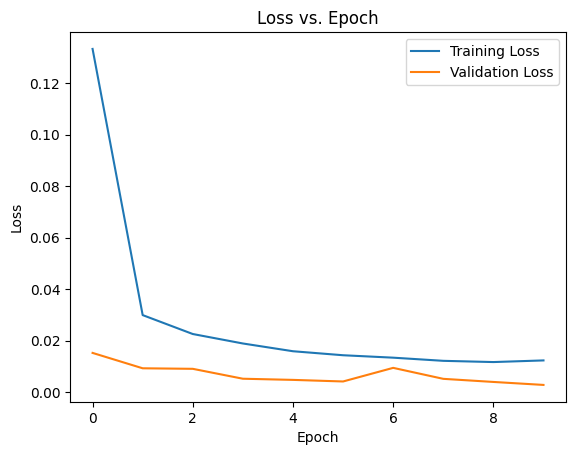

In [71]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.show()

# RNN + GRU

Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_5       │ (None, 19, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_4 (LSTM)       │ (None, 19, 64)    │     16,896 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_4 (GRU)         │ (None, 19, 64)    │     12,864 │ input_layer_5[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm_5 (LSTM)       │ (None, 64)        │     33,024 │ lstm_4[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ gru_5 (GRU)         │ (None, 64)        │     24,960 │ gru_4[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_7       │ (None, 128)       │          0 │ lstm_5[0][0],     │
│ (Concatenate)       │                   │            │ gru_5[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_10 (Dense)    │ (None, 128)       │     16,512 │ concatenate_7[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_8 (Dropout) │ (None, 128)       │          0 │ dense_10[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_11 (Dense)    │ (None, 1)         │        129 │ dropout_8[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 104,385 (407.75 KB)

 Trainable params: 104,385 (407.75 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 240s 10ms/step - accuracy: 0.7033 - loss: 0.5361 - val_accuracy: 0.8764 - val_loss: 0.2839
Epoch 2/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 237s 10ms/step - accuracy: 0.8941 - loss: 0.2489 - val_accuracy: 0.9592 - val_loss: 0.1085
Epoch 3/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 239s 10ms/step - accuracy: 0.9629 - loss: 0.0998 - val_accuracy: 0.9761 - val_loss: 0.0655
Epoch 4/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 237s 10ms/step - accuracy: 0.9811 - loss: 0.0555 - val_accuracy: 0.9841 - val_loss: 0.0448
Epoch 5/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 238s 10ms/step - accuracy: 0.9884 - loss: 0.0355 - val_accuracy: 0.9902 - val_loss: 0.0302
Epoch 6/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 237s 10ms/step - accuracy: 0.9920 - loss: 0.0246 - val_accuracy: 0.9943 - val_loss: 0.0172
Epoch 7/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 234s 10ms/step - accuracy: 0.9943 - loss: 0.0180 - val_accuracy: 0.9967 - val_loss: 0.0101
Epoch 8/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 234s 10ms/s

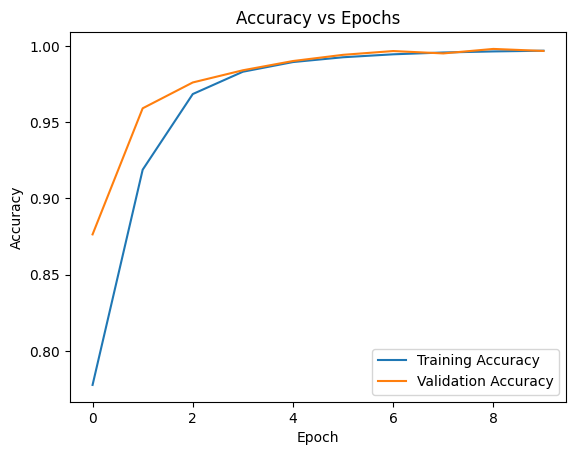

11992/11992 ━━━━━━━━━━━━━━━━━━━━ 32s 3ms/step
Confusion Matrix:


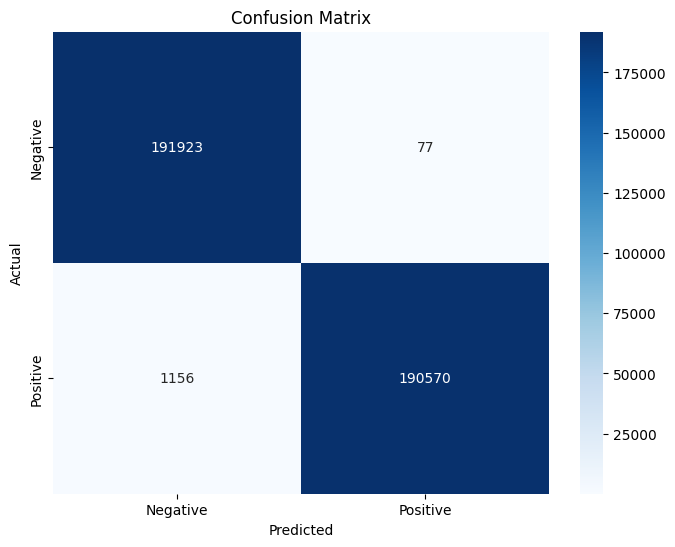

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      1.00    192000
           1       1.00      0.99      1.00    191726

    accuracy                           1.00    383726
   macro avg       1.00      1.00      1.00    383726
weighted avg       1.00      1.00      1.00    383726



In [72]:
import numpy as np
import pandas as pd
import tensorflow as tf
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Input, LSTM, GRU, Dense, Dropout, LayerNormalization, Concatenate, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import plot_model

# Separate features and labels
X = eeg_df.iloc[:, :-1].values  # Features (excluding the last column)
y = eeg_df.iloc[:, -1].values   # Labels (last column)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape the input data to match the expected shape for RNN
X_train = X_train.reshape(X_train.shape[0], X_train.shape[1], 1)
X_val = X_val.reshape(X_val.shape[0], X_val.shape[1], 1)

# Define model architecture
input_shape = (X_train.shape[1], 1)

# Input layer
inputs = Input(shape=input_shape)

# RNN (LSTM) layer
lstm_output = LSTM(64, return_sequences=True)(inputs)
lstm_output = LSTM(64)(lstm_output)

# GRU layer
gru_output = GRU(64, return_sequences=True)(inputs)
gru_output = GRU(64)(gru_output)

# Concatenate outputs from LSTM and GRU
concatenated_outputs = Concatenate()([lstm_output, gru_output])

# Fully connected layers
fc_output = Dense(128, activation='relu')(concatenated_outputs)
dropout_fc = Dropout(0.5)(fc_output)

# Output layer
outputs = Dense(1, activation='sigmoid')(dropout_fc)  # Adjust output units and activation function as needed

# Create model
model = Model(inputs=inputs, outputs=outputs)

# Compile the model
model.compile(optimizer=Adam(learning_rate=1e-4), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Train the model
batch_size = 64
num_epochs = 10

# Training
history = model.fit(X_train, y_train, epochs=num_epochs, batch_size=batch_size, validation_data=(X_val, y_val))

# Evaluate on validation data
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

# Plot the model architecture
plot_model(model, to_file='RNN_GRU.png', show_shapes=True, show_layer_names=True)


# Plot accuracy vs epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epochs')
plt.legend()
plt.show()

# Predict labels for validation set
y_pred = model.predict(X_val)
y_pred_binary = np.round(y_pred)

# Confusion matrix
cm = confusion_matrix(y_val, y_pred_binary)
print("Confusion Matrix:")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Classification report
print("Classification Report:")
print(classification_report(y_val, y_pred_binary))


In [73]:
from sklearn.metrics import mean_squared_error, precision_score, recall_score, f1_score
from math import sqrt

#calculate RMSE
print(sqrt(mean_squared_error(y_val, y_pred_binary)))
print(precision_score(y_val, y_pred_binary, average='binary'))
print(recall_score(y_val, y_pred_binary, average='binary'))
print(f1_score(y_val, y_pred_binary, average='binary'))

0.05668536207597927
0.9995961121863969
0.9939705621564107
0.996775399936711


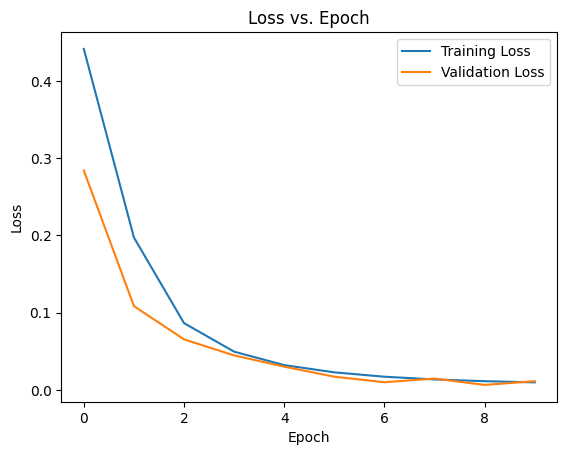

In [74]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.show()

# ResNet Model

Model: "functional_13"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_6       │ (None, 19, 1)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_9 (Conv1D)   │ (None, 10, 64)    │        512 │ input_layer_6[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_9     │ (None, 5, 64)     │          0 │ conv1d_9[0][0]    │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_10 (Conv1D)  │ (None, 5, 64)     │     12,352 │ max_pooling1d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 5, 64)     │          0 │ conv1d_10[0][0]   │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_11 (Conv1D)  │ (None, 5, 64)     │     12,352 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 5, 64)     │          0 │ conv1d_11[0][0],  │
│                     │                   │            │ max_pooling1d_9[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 5, 64)     │          0 │ add_2[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_12 (Conv1D)  │ (None, 5, 64)     │     12,352 │ activation_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 5, 64)     │          0 │ conv1d_12[0][0]   │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_13 (Conv1D)  │ (None, 5, 64)     │     12,352 │ activation_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 5, 64)     │          0 │ conv1d_13[0][0],  │
│                     │                   │            │ activation_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 5, 64)     │          0 │ add_3[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_14 (Conv1D)  │ (None, 5, 64)     │     12,352 │ activation_3[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 5, 64)     │          0 │ conv1d_14[0][0]   │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_15 (Conv1D)  │ (None, 5, 64)     │     12,352 │ activation_4[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, 5, 64)     │          0 │ conv1d_15[0][0],  │
│                     │                   │            │ activation_3[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_5        │ (None, 5, 64)     │          0 │ add_4[0][0]       │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_6 (Flatten) │ (None, 320)       │          0 │ activation_5[0][… │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 97,281 (380.00 KB)

 Trainable params: 97,281 (380.00 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 80s 3ms/step - accuracy: 0.9227 - loss: 0.1983 - val_accuracy: 0.9848 - val_loss: 0.0480
Epoch 2/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 70s 3ms/step - accuracy: 0.9861 - loss: 0.0408 - val_accuracy: 0.9906 - val_loss: 0.0253
Epoch 3/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 70s 3ms/step - accuracy: 0.9876 - loss: 0.0396 - val_accuracy: 0.9860 - val_loss: 0.0438
Epoch 4/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 74s 3ms/step - accuracy: 0.9878 - loss: 0.0388 - val_accuracy: 0.9916 - val_loss: 0.0248
Epoch 5/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 70s 3ms/step - accuracy: 0.9892 - loss: 0.0360 - val_accuracy: 0.9869 - val_loss: 0.0373
Epoch 6/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 70s 3ms/step - accuracy: 0.9903 - loss: 0.0323 - val_accuracy: 0.9925 - val_loss: 0.0256
Epoch 7/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 70s 3ms/step - accuracy: 0.9913 - loss: 0.0296 - val_accuracy: 0.9944 - val_loss: 0.0177
Epoch 8/10
23983/23983 ━━━━━━━━━━━━━━━━━━━━ 76s 3ms/step - accuracy: 

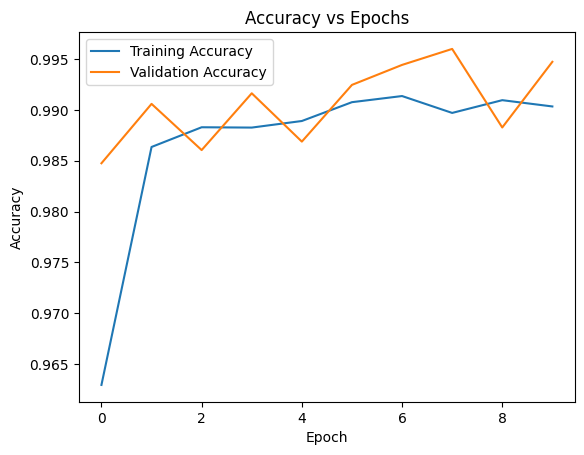

11992/11992 ━━━━━━━━━━━━━━━━━━━━ 18s 1ms/step
Confusion Matrix:


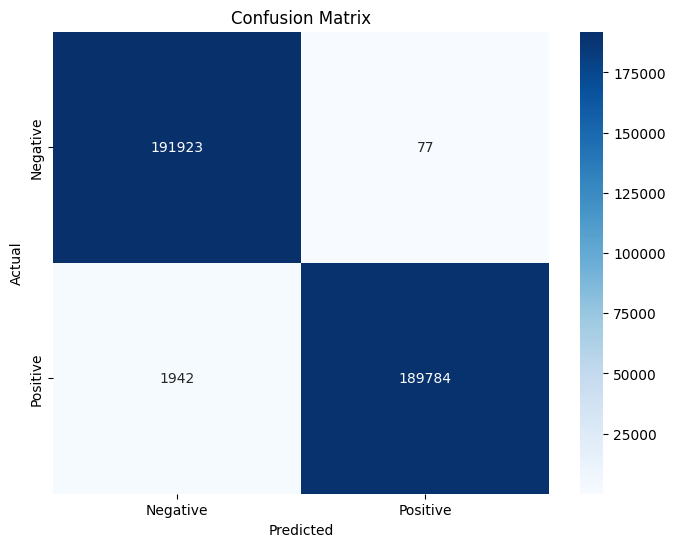

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99    192000
           1       1.00      0.99      0.99    191726

    accuracy                           0.99    383726
   macro avg       0.99      0.99      0.99    383726
weighted avg       0.99      0.99      0.99    383726



In [75]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, Dropout, Add, Activation
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam

# Separate features and labels
X = eeg_df.iloc[:, :-1].values  # Features (excluding the last column)
y = eeg_df.iloc[:, -1].values   # Labels (last column)

# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Define model architecture
input_shape = X_train.shape[1]

inputs = Input(shape=(input_shape, 1))

# Initial convolutional layer
x = Conv1D(64, kernel_size=7, strides=2, padding='same')(inputs)
x = MaxPooling1D(pool_size=3, strides=2, padding='same')(x)

# Residual blocks
for _ in range(3):
    # Identity branch
    y = x
    
    # Convolutional branch
    x = Conv1D(64, kernel_size=3, padding='same')(x)
    x = Activation('relu')(x)
    x = Conv1D(64, kernel_size=3, padding='same')(x)
    
    # Add identity and convolutional branch
    x = Add()([x, y])
    x = Activation('relu')(x)

# Flatten and dense layers
x = Flatten()(x)
x = Dense(64, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(32, activation='relu')(x)

# Output layer
outputs = Dense(1, activation='sigmoid')(x)

# Create model
model = Model(inputs=inputs, outputs=outputs)

# Compile model
model.compile(optimizer=Adam(learning_rate=0.001), loss='binary_crossentropy', metrics=['accuracy'])

# Print model summary
model.summary()

# Train model
history = model.fit(X_train, y_train, epochs=10, batch_size=64, validation_data=(X_val, y_val))

# Evaluate model
val_loss, val_accuracy = model.evaluate(X_val, y_val)
print(f"Validation Loss: {val_loss}, Validation Accuracy: {val_accuracy}")

# Plot accuracy vs epochs
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Epochs')
plt.legend()
plt.show()

# Predict labels for validation set
y_pred = model.predict(X_val)
y_pred_binary = np.round(y_pred)

# Confusion matrix
cm = confusion_matrix(y_val, y_pred_binary)
print("Confusion Matrix:")

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=['Negative', 'Positive'], yticklabels=['Negative', 'Positive'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

# Classification report
print("Classification Report:")
print(classification_report(y_val, y_pred_binary))


In [76]:
from sklearn.metrics import mean_squared_error, precision_score, recall_score, f1_score
from math import sqrt

#calculate RMSE
print(sqrt(mean_squared_error(y_val, y_pred_binary)))
print(precision_score(y_val, y_pred_binary, average='binary'))
print(recall_score(y_val, y_pred_binary, average='binary'))
print(f1_score(y_val, y_pred_binary, average='binary'))

0.07253665864359492
0.999594440143052
0.9898709616849045
0.9947089392458338


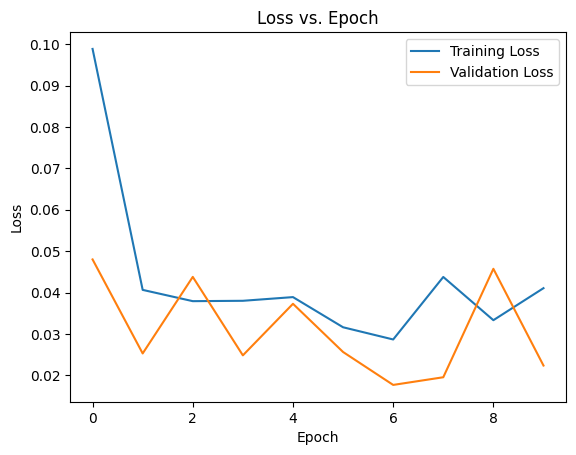

In [77]:
# Plot training and validation accuracy vs. epoch
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs. Epoch')
plt.legend()
plt.show()